# Clustering for Customer Segmentation and Persona Development
## Dataset
Dataset was initially found on [Kaggle.com](https://www.kaggle.com/datasets/vishakhdapat/customer-segmentation-clustering). However, this was not extremely descriptive so I did research to find out more details about this dataset. According to another [user's dataset](https://www.kaggle.com/datasets/rodsaldanha/arketing-campaign), which appears to be replica of initial download, this data was compiled in 2014. This also included a bit more information, such as much of the data has been collected over 2 years. This will be covered below.

A challenge for the persona development side of this project will be in the lack of knowledge of what store this is supposed to be for or even a description of their store. However, I will infer this is a grocery store due to the emphasis on food items in the spending tracking data. It is probably a "higher-end"  one because it is selling gold products.

#### If you download the notebook:
[Click here to skip to the results](#Persona)

If this is viewed on GitHub, scroll to end.

In [282]:
import pandas as pd
import numpy as np
import warnings

warnings.filterwarnings("ignore")
pd.set_option('display.max_columns',None)

path = r"customer_segmentation.csv"
CustData = pd.read_csv(path)
print(CustData.dtypes)
CustData.describe()

ID                       int64
Year_Birth               int64
Education               object
Marital_Status          object
Income                 float64
Kidhome                  int64
Teenhome                 int64
Dt_Customer             object
Recency                  int64
MntWines                 int64
MntFruits                int64
MntMeatProducts          int64
MntFishProducts          int64
MntSweetProducts         int64
MntGoldProds             int64
NumDealsPurchases        int64
NumWebPurchases          int64
NumCatalogPurchases      int64
NumStorePurchases        int64
NumWebVisitsMonth        int64
AcceptedCmp3             int64
AcceptedCmp4             int64
AcceptedCmp5             int64
AcceptedCmp1             int64
AcceptedCmp2             int64
Complain                 int64
Z_CostContact            int64
Z_Revenue                int64
Response                 int64
dtype: object


,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2240.000000,2240.000000,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.0,2240.0,2240.000000
mean,5592.159821,1968.805804,52247.251354,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,27.062946,44.021875,2.325000,4.084821,2.662054,5.790179,5.316518,0.072768,0.074554,0.072768,0.064286,0.013393,0.009375,3.0,11.0,0.149107
std,3246.662198,11.984069,25173.076661,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,41.280498,52.167439,1.932238,2.778714,2.923101,3.250958,2.426645,0.259813,0.262728,0.259813,0.245316,0.114976,0.096391,0.0,0.0,0.356274
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,2828.250000,1959.000000,35303.000000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,1.000000,9.000000,1.000000,2.000000,0.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,8.000000,24.000000,2.000000,4.000000,2.000000,5.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,8427.750000,1977.000000,68522.000000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,33.000000,56.000000,3.000000,6.000000,4.000000,8.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,263.000000,362.000000,15.000000,27.000000,28.000000,13.000000,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000


### Initial Correlation Look
Let's get a good fingertip feel of the data

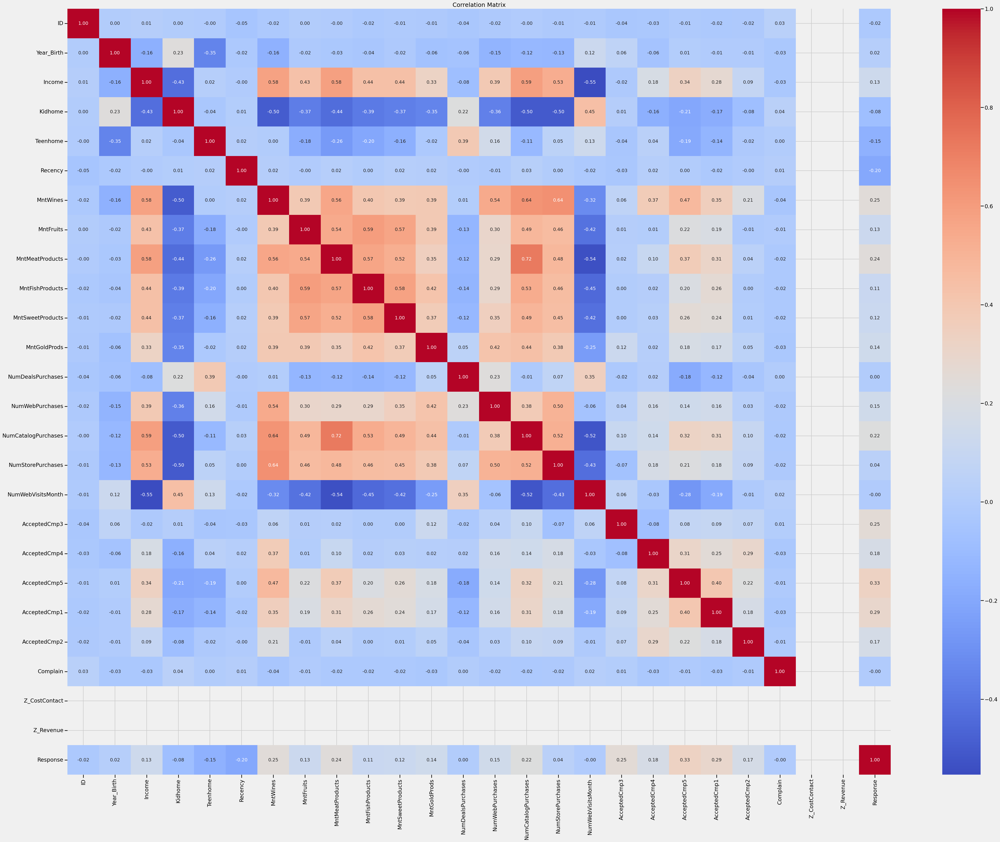

In [283]:
import matplotlib.pyplot as plt
import seaborn as sns


# correlation heatmap with numeric values
num_cols = CustData.select_dtypes(include=["number"]).columns
correlation_matrix = CustData[num_cols].corr()
plt.figure(figsize=(50, 40))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 14})
plt.title('Correlation Matrix')
plt.show()

## Initial Exploration
### Original Features Explained
- `Id`, int discrete: Unique ID for each customer
- `Year_Birth`, DateTime: Birth year
- `Education`, str ordinal: Highest level of education achieved by customer
- `Marital_Status`, str nominal: What is their current marital status
- `Income`, int continuous: Annual income of customer
- `Kidhome`, int continuous: Amount of children living in household
- `Teenhome`, int continuous: Amount of teens living in household
- `Dt_Customer`, DateTime: Date became customer (or at least first time added in database)
- `Recency`, int continuous: Days since last purchase or interaction
- `MntWines`, int continuous: Amount spent on wines in last two years
- `MntFruits`, int continuous: Amount spent on fruits in last two years
- `MntMeatProducts`, int continous: Amount spent on meats in last two years
- `MntFishProducts`, int continous: Amount spent on fish in last two years
- `MntSweetProducts`, int continous: Amount spent on sweets in last two years
- `MntGoldProducts`, int continous: Amount spent on gold (appears to be the periodic element and not the Gold Standard by Optimum :/ )
- `NumDealPurchases`,int continous: Number of purchases which involved a discount or deal
- `NumWebPurchases`,int continous: Number of purchases which were made via the company's website
- `NumCatalogPurchases`,int continous: Number of purchases which were made through catalogs
- `NumStorePurchases`,int continous: Number of purchases which were made through physical stores
- `NumWebVisitsMonth`,int continous: Number of visits to the company website in a month
- `AcceptedCmp3`, int binary: Whether the accepted campaign #3
- `AcceptedCmp4`, int binary: Whether the accepted campaign #4
- `AcceptedCmp5`, int binary: Whether the accepted campaign #5
- `AcceptedCmp1`, int binary: Whether the accepted campaign #1
- `AcceptedCmp2`, int binary: Whether the accepted campaign #2
- `Complain`, int binary: Have they complained in the past two years?
- `Z_CostContact`, int constant: Cost associated with contacting a customer
- `Z_Revenue`, int constant: Revenue associated with a successful campaign response
- `Response`, int binary: Whether the customer responded to the marketing campaign

##### Do not delete right now but do not use for clustering...
We will not use `ID`, `Year_Birth`(we will use bins), `Dt_Customer`(which will have a feature derived), both constants, and `Response` in the actual clustering analysis

#### Looking at the data and descriptivie stats
It appears `Income` is the only columns containing nulls. After some thought, this could be possibly due to the person being a non-earner so it will be best to replace the nulls as 0s

Interestingly, looks like there is an 1893 year of birth in `Year_Birth`. I think we should look how much of an outlier this is or if there is legitmate value in keeping such an eyecatching value

In [284]:
CustData["Year_Birth"].sort_values(ascending=True)

239     1893
339     1899
192     1900
1950    1940
424     1941
        ... 
747     1995
1850    1995
696     1995
1170    1996
46      1996
Name: Year_Birth, Length: 2240, dtype: int64

Hmmm, well this would not be great if we were using Year as a continuous value. However, I thought it might be insightful to turn the `Year_Birth` into different age groups rather than continuous values. This should allow us to use the data here without adding outlier data. It is also possible they are typos, meaning to put 19 for the 1893 and 1899 entry but the 1900 value seems to be purposeful. Finally, it is also possible it is bad data of a fake account. I think it would be best to just remove this consider these comprise only 3 of the 2240 record list.

This one occured when I manually checked the unique values in the Excel sheet: Let's look at the `Martial_Status` unique values:

In [285]:
CustData["Marital_Status"].value_counts()

Marital_Status
Married     864
Together    580
Single      480
Divorced    232
Widow        77
Alone         3
Absurd        2
YOLO          2
Name: count, dtype: int64

I cannot say `YOLO` and `Absurd` sound like legitmate marital status' and could present trouble in associating their meaning to another group. We will remove these values. We will also assign the `Alone` values to become `Single` since they cognate the same meaning.

## Feature Engineering & Data Exploration
### Feature Engineering
##### Encodings
- Encode Marital Status, Education

#### Generated Features

In [286]:
import re
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV

le = LabelEncoder()

### filter out the possible bad data
# 1939 and prior years
CustData = CustData[CustData["Year_Birth"] >= 1940]
# YOLO and Absurd
CustData = CustData[~CustData["Marital_Status"].isin(["Absurd", "YOLO"])]
# alone to single
CustData["Marital_Status"] = CustData["Marital_Status"].replace("Alone", "Single")

### fill nulls in `Income` with the assumption that the person does not earn income
CustData["Income"] = CustData["Income"].fillna(0)

### year became customer
CustData["YearBecameCustomer"] = CustData["Dt_Customer"].str.extract(r'(\b\d{2}[/-]\d{2}[/-](\d{4})\b)', expand=False)[1]
CustData["YearBecameCustomer"] = le.fit_transform(CustData["YearBecameCustomer"])

### age groupings
def ageBins(df:pd.DataFrame, bin_values:list,labels:list,grouping:str):
    """
    Creates age groups, only can use age groups of ["Gen","10yr","15yr"]
    Input:
    -- df: Customer DataFrame
    -- bin_values: Age value to make the bins on
    -- labels: Labels for the age group
    -- grouping: Will this be for generational, 10yr, or 15 yr age groupings
    Output:
    -- df: DataFrame with new column created via input args
    """
    if grouping not in ["Gen","10yr","15yr"]:
        raise ValueError('Use one of the following for grouping: ["Gen","10yr","15yr"]')
    df[f"{grouping}AG"] = pd.cut(df["Year_Birth"],bins=bin_values,labels=labels,include_lowest=True,right=True)
    df[f"{grouping}AG"] = le.fit_transform(df[f"{grouping}AG"])
    return df  
# by generation
CustData = ageBins(CustData,[1940,1945,1964,1980,1996],["Sil.","Boomer","X","Millen"],"Gen")
# by ~10yr age group
CustData = ageBins(CustData,[1940,1949,1959,1969,1979,1989,1996],["40s","50s","60s","70s","80s","90s"],"10yr")
# by ~15yr age group
CustData = ageBins(CustData,[1940,1955,1970,1985,1996],["40-55","56-70","71-85","86-96"],"15yr")

### HouseHold numbers
# Number of possible household incomes
TwoPerson = ["Together","Married"]
CustData["HouseHoldIncomeNum"] = [2 if x in TwoPerson else 1 for x in CustData["Marital_Status"]]
# total children
CustData["TotalChildren"] = CustData["Kidhome"]+CustData["Teenhome"]
# total household members
CustData["TotalHHMembers"] = CustData["TotalChildren"] + CustData["HouseHoldIncomeNum"]

### IQR of Incomes
def quantileLoc(df:pd.DataFrame, columns:list):
    """
    Returns the quantile the value belongs in compared to the rest of the column
    Input:
    -- df: Customer DataFrame
    -- columns: List of columns we want to see where different people fall in terms of their IQR range position
    Output:
    -- df: DataFrame with quantiles of the specified column(s)
    """
    for col in columns:
        quantiles = [df[col].quantile(0), df[col].quantile(0.25), df[col].quantile(0.5), df[col].quantile(0.75), df[col].quantile(1)]
        df[f"{col}Quantile"] = pd.cut(df[col], bins=quantiles, labels=[1, 2, 3, 4], include_lowest=True,right=True)
    return df
CustData = quantileLoc(CustData,["Income"])
# remember that these values will be cats, so we need to replace them with numbers and with map we can do it precisely
NumMap = {"1":1,"2":2,"3":3,"4":4}
CustData["IncomeQuantile"] = CustData["IncomeQuantile"].astype(str).map(NumMap)

### Amount Spent & Ratios on various food and other item groups
# total
CustData["TotalMnt"] = CustData["MntWines"] + CustData["MntFruits"] + CustData["MntMeatProducts"] + CustData["MntFishProducts"] + CustData["MntSweetProducts"] + CustData["MntGoldProds"]
# proteins
CustData["MntProtein"] = CustData["MntMeatProducts"] + CustData["MntFishProducts"]
# pesc.
CustData["MntPesc"] = CustData["MntFruits"] + CustData["MntFishProducts"]
# semi-healthy
CustData["MntSemiHealth"] = CustData["MntFruits"] + CustData["MntMeatProducts"] + CustData["MntFishProducts"]
# indulgent/generally high calorie items
CustData["MntIndulgence"] = CustData["MntWines"] + CustData["MntSweetProducts"]
# diet ratio
CustData["DietRatio"] = CustData["MntSemiHealth"]/CustData["MntIndulgence"]
# high life ratio - indulgent spending versus income
CustData["IncomeLuxSpendRatio"] = CustData["Income"]/(CustData["MntWines"]+CustData["MntGoldProds"])      

### Ind. differences from their group median's
# encode education and martial status
CustData["Marital_Status"] = le.fit_transform(CustData["Marital_Status"])
CustData["Education"] = le.fit_transform(CustData["Education"])
# record difference from median feature value of a group
def diffFromMedianValueByGroup(df:pd.DataFrame, value_column:str , group:str):
    """
    Returns a dataframe with a new column showing the difference from the median of a group based on a certain stat
    Input:
    -- df: Customer DataFrame
    -- value_column: Column which will be metric we are trying to analyze, preferably continuous
    -- group: Group we want to observe the median of
    Output:
    -- df: Dataframe showing the difference from the median of a group from the value specified in a record
    """
    df[f"{value_column} difference from {group} median"] = df[value_column]-df.groupby(group)[value_column].transform('median')
    return df
## for income
# difference of median income by generation
CustData = diffFromMedianValueByGroup(CustData,"Income","GenAG")
# difference of median income by 10yr age group
CustData = diffFromMedianValueByGroup(CustData,"Income","10yrAG")
# difference of median income by 15 yr age group
CustData = diffFromMedianValueByGroup(CustData,"Income","15yrAG")
# difference of median income by marital status
CustData = diffFromMedianValueByGroup(CustData,"Income","Marital_Status")
# difference of median income by education
CustData = diffFromMedianValueByGroup(CustData,"Income","Education")
# difference of median income by total household members
CustData = diffFromMedianValueByGroup(CustData,"Income","TotalHHMembers")
# difference of median income by total children
CustData = diffFromMedianValueByGroup(CustData,"Income","TotalChildren")
## for total spending
# difference of median totolmnt by generation
CustData = diffFromMedianValueByGroup(CustData,"TotalMnt","GenAG")
# difference of median totolmnt by 10yr age group
CustData = diffFromMedianValueByGroup(CustData,"TotalMnt","10yrAG")
# difference of median totolmnt by 15 yr age group
CustData = diffFromMedianValueByGroup(CustData,"TotalMnt","15yrAG")
# difference of median totolmnt by marital status
CustData = diffFromMedianValueByGroup(CustData,"TotalMnt","Marital_Status")
# difference of median totolmnt by education
CustData = diffFromMedianValueByGroup(CustData,"TotalMnt","Education")
# difference of median totolmnt by total household members
CustData = diffFromMedianValueByGroup(CustData,"TotalMnt","TotalHHMembers")
# difference of median totolmnt by total children
CustData = diffFromMedianValueByGroup(CustData,"TotalMnt","TotalChildren")

### Purchase volumes
# total purchase volume tracked
CustData["TotalPurchases"] = CustData["NumWebPurchases"]+CustData["NumCatalogPurchases"]+CustData["NumStorePurchases"]
# number of deal/discounted purchases compared to number of total purchases
CustData["ThriftRatio"] = CustData["NumDealsPurchases"]/CustData["TotalPurchases"]
# website visits to web purchase ratio
CustData["WebVisitPurchaseRatio"] = CustData["NumWebPurchases"]/CustData["NumWebVisitsMonth"]

### purchase medium information
# out of store purchase total: catalog + web
CustData["OutOfStorePurchases"] = CustData["NumWebPurchases"]+CustData["NumCatalogPurchases"]
# medium which highest volume of purchases made through
def mediumPref(row):
    if row['NumWebPurchases'] > row['NumCatalogPurchases'] and row['NumWebPurchases'] > row['NumStorePurchases']:
        return 'Web'
    elif row['NumCatalogPurchases'] > row['NumWebPurchases'] and row['NumCatalogPurchases'] > row['NumStorePurchases']:
        return 'Catalog'
    else:
        return 'Instore'
CustData["PreferredMedium"] = CustData.apply(mediumPref,axis=1)
CustData["PreferredMedium"] = le.fit_transform(CustData["PreferredMedium"])
# shows how many purchases were made out of store vs. in store
CustData['ContactlessRatio'] = (CustData["TotalPurchases"]-CustData["NumStorePurchases"])/CustData["TotalPurchases"]

### campaign stats
# how many of the campaigns were accepted
CustData["TotalCmpAccepted"] = CustData["AcceptedCmp3"] + CustData["AcceptedCmp4"] + CustData["AcceptedCmp5"] + CustData["AcceptedCmp1"] + CustData["AcceptedCmp2"]
# based on the constant values, what would the net profit be based on the response for the campaign
CustData["NetProfitCmpCaptured"] = (CustData["TotalCmpAccepted"]*CustData["Z_Revenue"])-(5*CustData["Z_CostContact"])

In [287]:
CustData.head(10)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,YearBecameCustomer,GenAG,10yrAG,15yrAG,HouseHoldIncomeNum,TotalChildren,TotalHHMembers,IncomeQuantile,TotalMnt,MntProtein,MntPesc,MntSemiHealth,MntIndulgence,DietRatio,IncomeLuxSpendRatio,Income difference from GenAG median,Income difference from 10yrAG median,Income difference from 15yrAG median,Income difference from Marital_Status median,Income difference from Education median,Income difference from TotalHHMembers median,Income difference from TotalChildren median,TotalMnt difference from GenAG median,TotalMnt difference from 10yrAG median,TotalMnt difference from 15yrAG median,TotalMnt difference from Marital_Status median,TotalMnt difference from Education median,TotalMnt difference from TotalHHMembers median,TotalMnt difference from TotalChildren median,TotalPurchases,ThriftRatio,WebVisitPurchaseRatio,OutOfStorePurchases,PreferredMedium,ContactlessRatio,TotalCmpAccepted,NetProfitCmpCaptured
0,5524,1957,2,2,58138.0,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1,0,0,1,1,1,0,1,3,1617,718,260,806,723,1.114799,80.412172,819.5,1587.0,3415.0,10039.0,6544.0,-14003.5,-13928.0,1030.5,1073.0,1123.5,1256.0,1203.0,428.5,428.0,22,0.136364,1.142857,18,0,0.818182,0,-15
1,2174,1954,2,2,46344.0,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0,2,0,1,0,1,2,3,2,27,8,3,9,12,0.750000,2726.117647,-10974.5,-10207.0,-13010.0,-1755.0,-5250.0,1184.0,2568.0,-559.5,-517.0,-610.0,-334.0,-387.0,-208.0,-66.0,4,0.500000,0.200000,2,1,0.500000,0,-15
2,4141,1965,2,3,71613.0,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0,1,3,2,1,2,0,2,4,776,238,160,287,447,0.642058,153.019231,24502.0,17415.5,16890.0,20670.0,20019.0,11640.0,-453.0,497.0,310.5,282.5,384.0,362.0,30.0,-413.0,20,0.050000,2.000000,10,1,0.500000,0,-15
3,6182,1984,2,3,26646.0,1,0,10-02-2014,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0,2,1,4,2,2,1,3,1,53,30,14,34,14,2.428571,1665.375000,-12035.5,-12034.0,-16638.5,-24297.0,-24948.0,-18514.0,-20261.0,-112.0,-103.0,-150.5,-339.0,-361.0,-182.0,-252.0,6,0.333333,0.333333,2,1,0.333333,0,-15
4,5324,1981,4,1,58293.0,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0,2,1,4,2,2,1,3,3,422,164,89,207,200,1.035000,310.069149,19611.5,19613.0,15008.5,6772.0,3281.0,13133.0,11386.0,257.0,266.0,218.5,25.5,-71.0,187.0,117.0,14,0.357143,1.000000,8,1,0.571429,0,-15
5,7446,1967,3,3,62513.0,0,1,09-09-2013,16,520,42,98,0,42,14,2,6,4,10,6,0,0,0,0,0,0,3,11,0,1,3,2,1,2,1,3,3,716,98,42,140,562,0.249110,117.065543,15402.0,8315.5,7790.0,11570.0,12499.0,17353.0,15606.0,437.0,250.5,222.5,324.0,331.0,481.0,411.0,20,0.100000,1.000000,10,1,0.500000,0,-15
6,965,1971,2,0,55635.0,0,1,13-11-2012,34,235,65,164,50,49,27,4,7,3,7,6,0,0,0,0,0,0,3,11,0,0,3,3,2,1,1,2,3,590,214,115,279,284,0.982394,212.347328,8524.0,9584.0,12350.5,2601.0,4041.0,-4338.0,8728.0,311.0,345.0,386.5,190.0,176.0,-156.0,285.0,17,0.235294,1.166667,10,1,0.588235,0,-15
7,6177,1985,4,1,33454.0,1,0,08-05-2013,32,76,10,56,3,1,23,2,4,0,4,8,0,0,0,0,0,0,3,11,0,1,1,4,2,2,1,3,1,169,59,13,69,77,0.896104,337.919192,-5227.5,-5226.0,-9830.5,-18067.0,-21558.0,-11706.0,-13453.0,4.0,13.0,-34.5,-227.5,-324.0,-66.0,-136.0,8,0.250000,0.500000,4,1,0.500000,0,-15
8,4855,1974,4,3,30351.0,1,0,06-06-2013,19,14,0,24,3,3,2,1,3,0,2,9,0,0,0,0,0,0,3,11,1,1,3,3,2,2,1,3,1,46,27,3,27,17,1.588235,1896.937500,-16760.0,-15700.0,-12933.5,-20592.0,-24661.0,-14809.0,-16556.0,-233.0,-199.0,-157.5,-346.0,-447.0,-189.0,-259.0,5,0.200000,0.333333,3,2,0.600000,0,-15
9,5899,1950,4,3,5648.0,1,1,13-03-2014,68,28,0,6,1,1,13,1,1,0,0,20,1,0,0,0,0,0,3,11,0,2,0,1,0,2,2,4,1,49,7,1,7,29,0.241379,137.756098,-51670.5,-50903.0,-53706.0,-45295.0,-49364

In [288]:
with pd.option_context('display.max_rows', None):
    print(CustData.dtypes)

ID                                                  int64
Year_Birth                                          int64
Education                                           int32
Marital_Status                                      int32
Income                                            float64
Kidhome                                             int64
Teenhome                                            int64
Dt_Customer                                        object
Recency                                             int64
MntWines                                            int64
MntFruits                                           int64
MntMeatProducts                                     int64
MntFishProducts                                     int64
MntSweetProducts                                    int64
MntGoldProds                                        int64
NumDealsPurchases                                   int64
NumWebPurchases                                     int64
NumCatalogPurc

#### Looking at `IncomeLuxSpendRatio`
Recall that we filled the missing values in `Income` with `0`. However, this will cause issues with trying to establish how much they spend as a function of income. We hypothesized that these people may be non-income earners which might be useful in other cases, but the goal of ILS ratio was to look at the potential spending/saving behaviors of people. This would be a good place to introduce Linear Regression to create a reasonable prediction.

*We will use* **manual feature selection** *here*. I would rather have a reasonably good prediction than trying to 'fine tune' the prediction when there are more outside variables which could be affecting this.

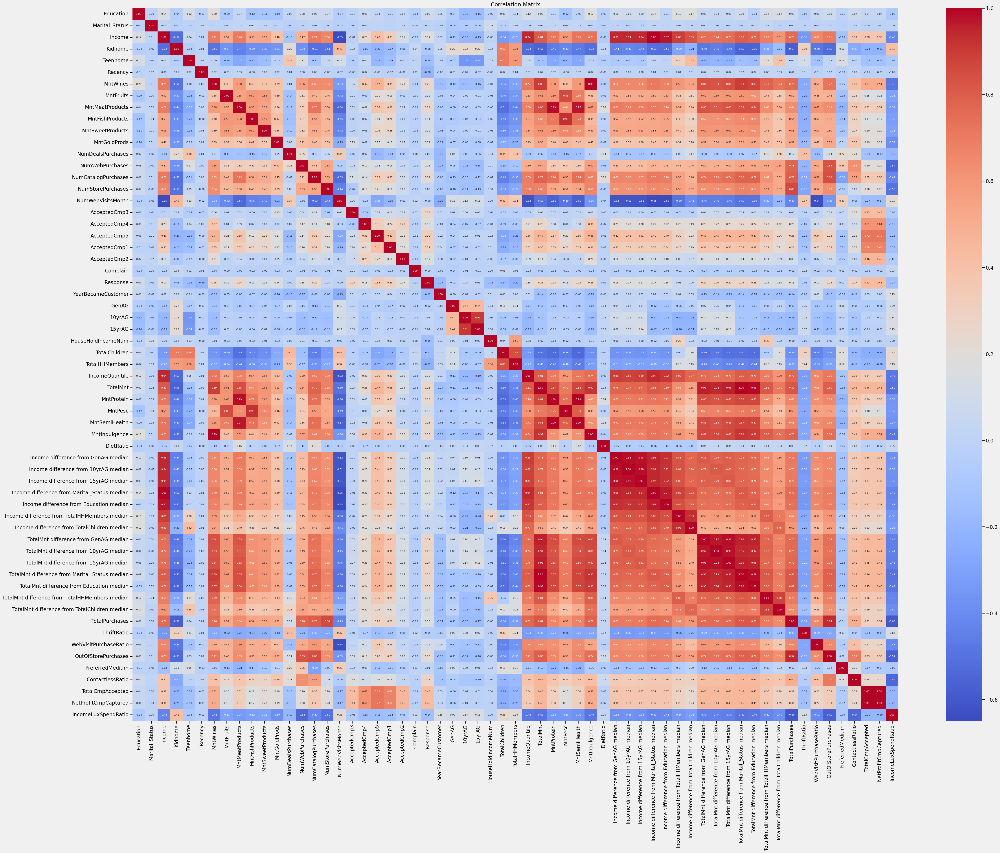

In [289]:
from scipy import stats

# # drop all of these previously stated, except for response
CustData.drop(columns=["ID","Year_Birth","Dt_Customer","Z_CostContact","Z_Revenue"],inplace=True)
# # will not cluster with it because we would not know if someone would respond prior
# # but since we will want to optimize our market our reach efforts, this will be desirable feature to analysis in EDA

test = CustData.copy()
z_scores = np.abs((test["IncomeLuxSpendRatio"] - test["IncomeLuxSpendRatio"].mean())/test["IncomeLuxSpendRatio"].std())
# remove outliers
test = test[z_scores <=3]
# remove the 0 scores we are trying to calculate # this is also a non-negative ratio since you cannot spend negative money
test = test[test["IncomeLuxSpendRatio"] > 0]
# remove infs from dividing by zero
test = test[~test["IncomeLuxSpendRatio"].isin([np.inf, -np.inf])]
# remove nans
test.dropna(subset=["IncomeLuxSpendRatio"], inplace=True)
# put the ILS ratio at the end for easier reading
cols = [col for col in test.columns if col != 'IncomeLuxSpendRatio']
cols.append('IncomeLuxSpendRatio')
test = test[cols]

# correlation heatmap with numeric values
num_cols = test.select_dtypes(include=["number"]).columns
correlation_matrix = test[num_cols].corr()
plt.figure(figsize=(50, 40))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 8})
plt.title('Correlation Matrix')
plt.show()

Based on correlation matrix above, with a combination of my own intuition & understanding of the data, these are the 5 features which caught my eye:
- `TotalPurchases`
- `TotalMnt difference from Marital_Status`
- `MntWines`
- `MntGoldProds`
- `ContactlessRatio`

There were other values which caught my eye but they would have obviously had collinearity with the above, so I did not list them.

While some of the selected could have collinearity as well, they were just the ones that both resignated in my mind based on the purpose I created them and had reasonably good correlation scores. However, we will not be performing our feature selection on correlation and intuition alone.

#### Normalizing ILS Ratio
Regression works best if we are able to normalize the target variable as much as possible. Hmm, I wonder how our ILS ratio is doing:

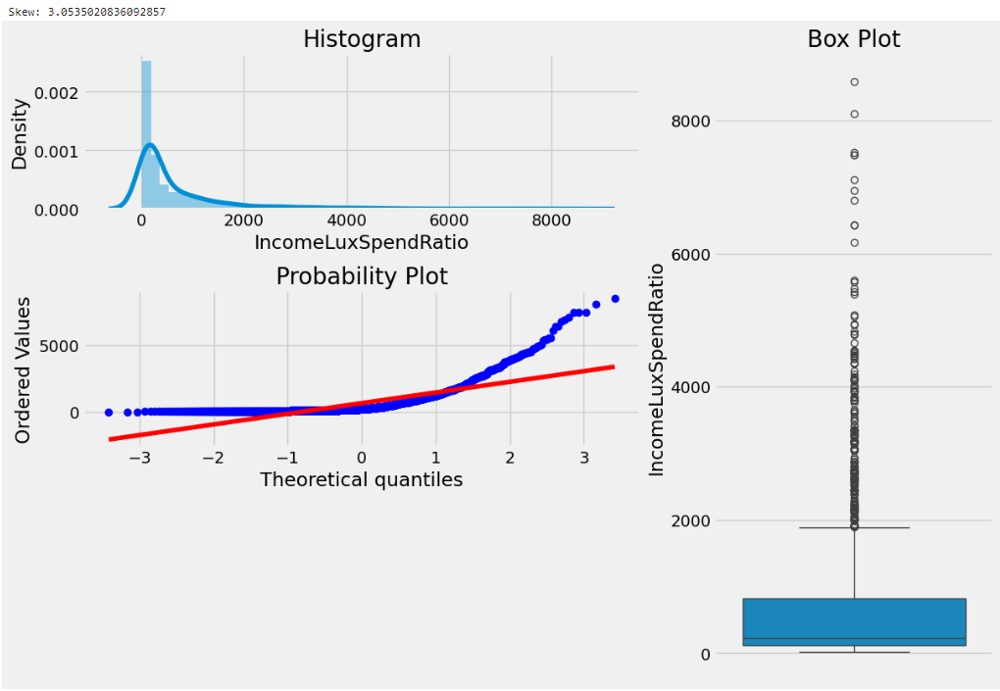

Yeah, so we will explore if any of the following transformations will help with this.

In [290]:
### transformations
# boxcox
test["BX_ILS"],lambda_ = stats.boxcox(test["IncomeLuxSpendRatio"] + 1)
# log
test["Log_ILS"] = np.log(test["IncomeLuxSpendRatio"]+0.01)
# square root
test["SQRT_ILS"] = np.sqrt(test["IncomeLuxSpendRatio"])
# squared
test["sq_ILS"] = test["IncomeLuxSpendRatio"]**2

Skew: 7.255023221825676


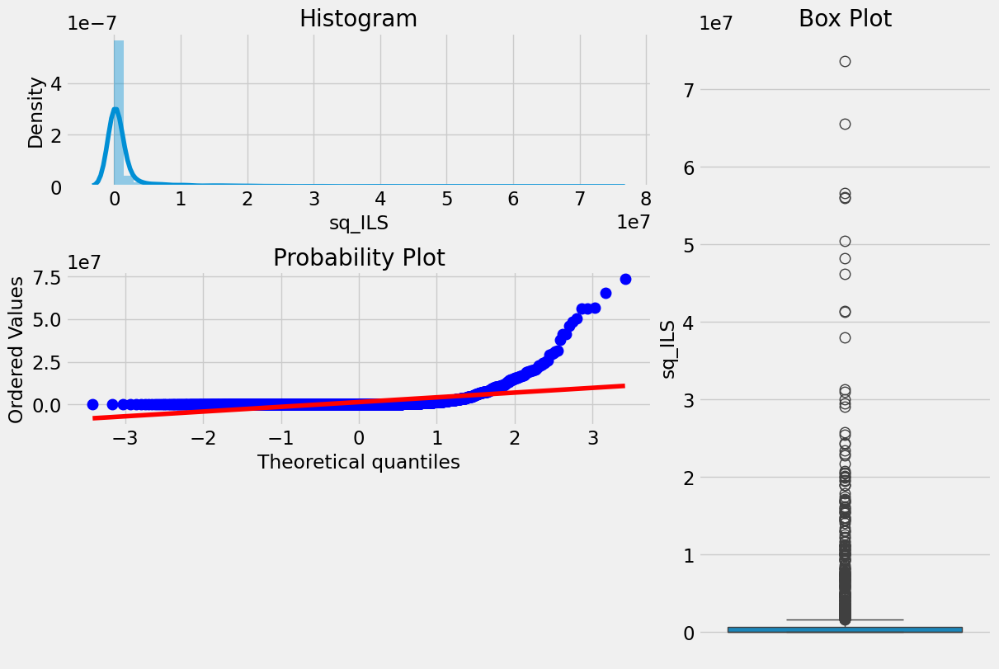

In [291]:
def checkNormalization(data,feature):
    import matplotlib.gridspec as gridspec
    import matplotlib.style as style
    style.use('fivethirtyeight')
    ## chart base 
    fig = plt.figure(constrained_layout=True, figsize=(12,8)) 
    grid = gridspec.GridSpec(ncols=3, nrows=3, figure=fig)
    # histogram
    ax1 = fig.add_subplot(grid[0, :2])
    ax1.set_title('Histogram')
    sns.distplot(data.loc[:,feature], norm_hist=True, ax = ax1)
    # qq plot
    ax2 = fig.add_subplot(grid[1, :2])
    ax2.set_title('QQ_plot')
    stats.probplot(data.loc[:,feature], plot = ax2)
    ## box plot 
    ax3 = fig.add_subplot(grid[:, 2])
    ax3.set_title('Box Plot')
    sns.boxplot(data.loc[:,feature], orient='v', ax = ax3);
col = "sq_ILS"
checkNormalization(test,col)
print(f"Skew: {test[col].skew()}")

##### BoxCox
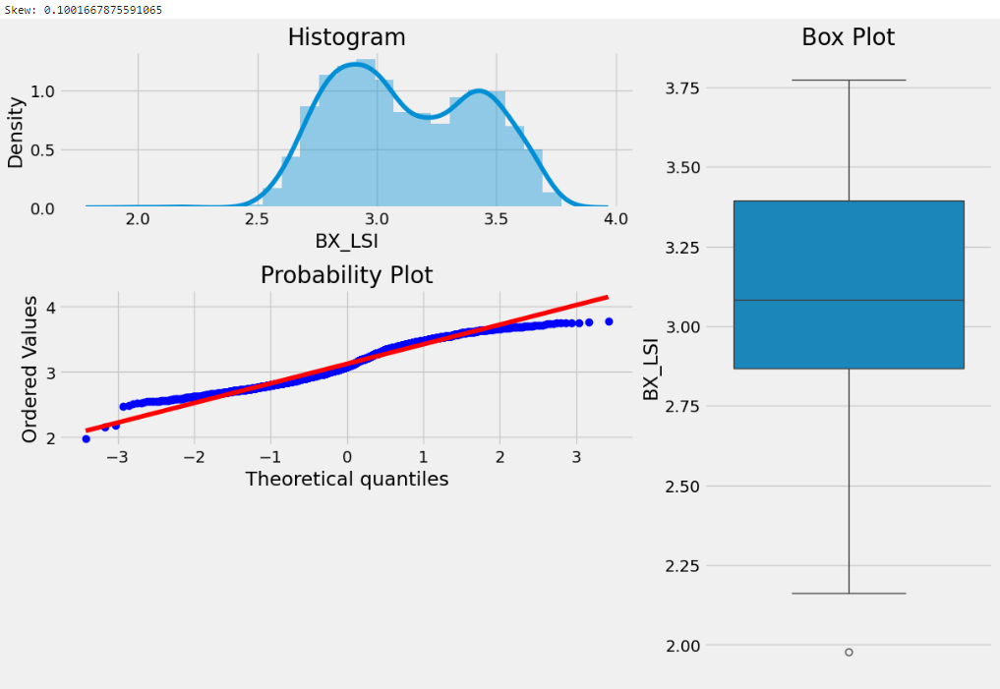
##### Log
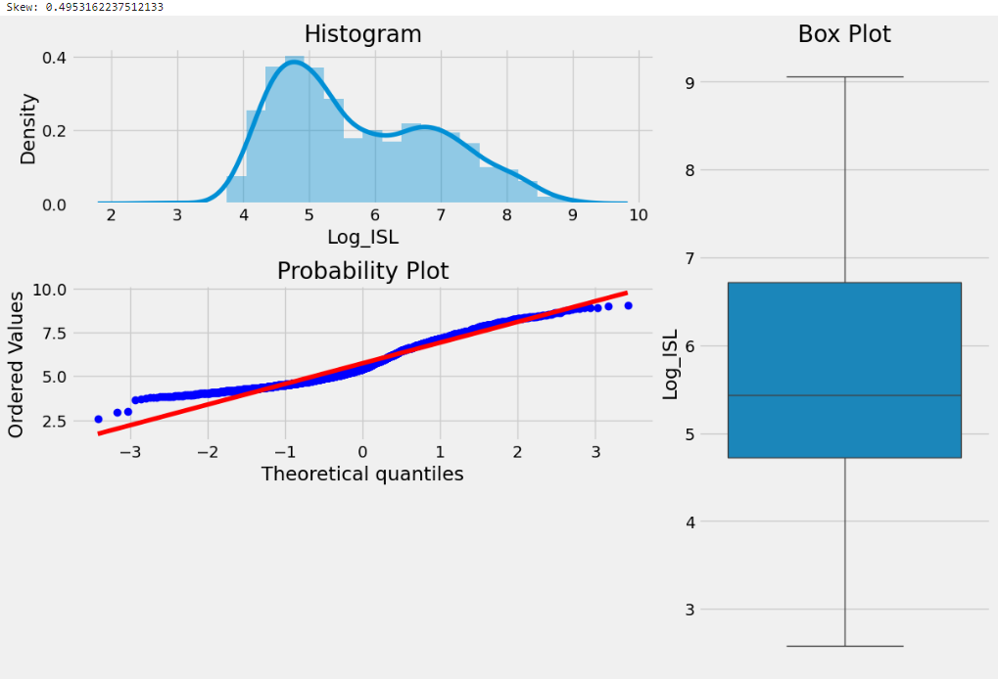
##### SQRT
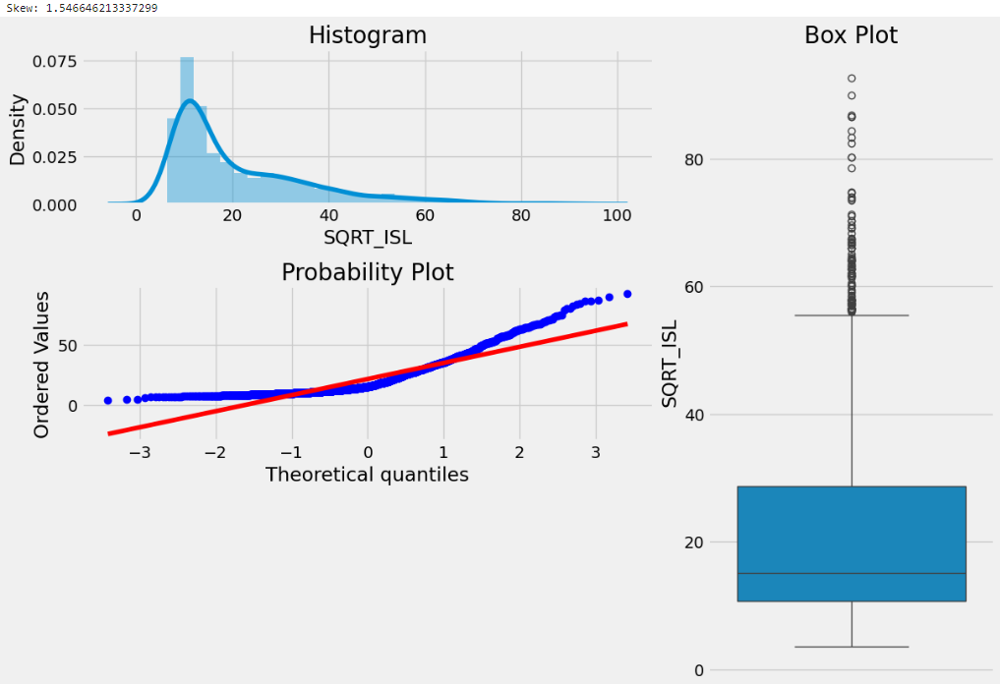
##### Square
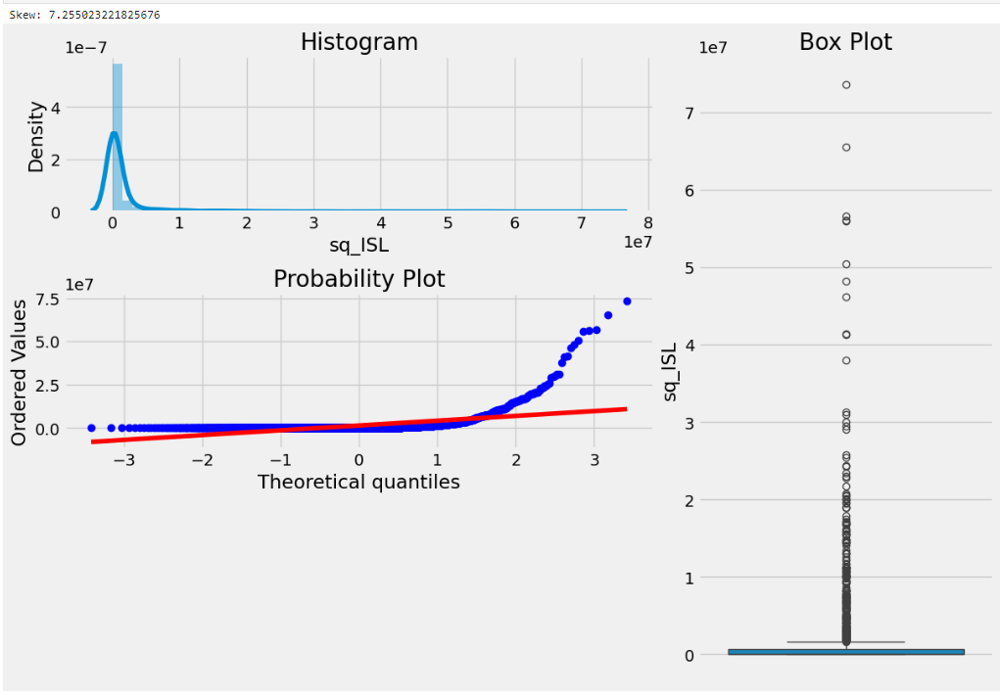

#### Reviewing our outputs
While the boxcox isn't producing a perfect bell curve, it is still relatively normalized. The log transformation also is performing decently, However, boxcox is outperforming or close on all of the visuals and signficantly less skewed, and therefore we choose ***boxcox*** to provide a normalized transformation of the ISL

#### Performing Ridge and LASSO to Look at Feature Importance
##### **LASSO**

In [292]:
from sklearn.linear_model import Lasso

# we will drop the non-normalized targets
ils_ratio = test["IncomeLuxSpendRatio"]
test.drop(columns=["IncomeLuxSpendRatio", "Log_ILS", "SQRT_ILS", "sq_ILS"], inplace=True)
# print("Columns after dropping non-normalized targets:", test.columns)
# now the boxcox trans ILS ratio
Y = test.iloc[:,-1]
# create the X from the remaining
X = test.iloc[:,:-1]
num_cols = X.select_dtypes(include=['number']).columns.tolist()

# # was checking an error caused by both nans and infs
# numeric_X = X.select_dtypes(include=[np.number])
# with pd.option_context('display.max_rows', None):
#     print("Checking for NaN values:", np.isnan(numeric_X).sum())
#     print("Checking for inf values:", np.isinf(numeric_X).sum())
# replace the few nans and infs with 0, appear to be due to division by zero upon inspection in excel
X.replace([np.inf, -np.inf, np.nan], 0, inplace=True)

transform = StandardScaler()
X = transform.fit_transform(X)

lasso = Lasso()
param_grid = {
    "alpha": [0.1, 1, 5, 10],
    "max_iter": [100, 500, 1000] 
}

lasso_CV = GridSearchCV(lasso,param_grid, cv=10)
lasso_CV.fit(X,Y)

best_lasso = lasso_CV.best_estimator_
coefs = pd.Series(best_lasso.coef_, index=num_cols)
lasso_features = coefs[coefs != 0].sort_values(ascending=False)
# do not want to alls use max rows, but we need it here
with pd.option_context('display.max_rows', None):
    print(lasso_features)

NumWebPurchases   -0.010288
TotalPurchases    -0.071268
MntWines          -0.100419
dtype: float64


##### **Ridge**

In [293]:
from sklearn.linear_model import Ridge

ridge = Ridge()
param_grid = {
    "alpha": [0.1, 1, 5, 10],
    "max_iter": [100, 500, 1000],
    "solver": ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga']
}

ridge_CV = GridSearchCV(ridge,param_grid, cv=10)
ridge_CV.fit(X,Y)

best_ridge = ridge_CV.best_estimator_
coefs = pd.Series(best_ridge.coef_, index=num_cols)
ridge_features = coefs[coefs != 0].sort_values(ascending=False)
# do not want to alls use max rows, but we need it here
with pd.option_context('display.max_rows', None):
    print(ridge_features)

NumCatalogPurchases                               0.029889
Kidhome                                           0.024091
Income difference from TotalChildren median       0.020332
Income difference from Education median           0.018824
MntMeatProducts                                   0.018569
MntSweetProducts                                  0.017886
OutOfStorePurchases                               0.017659
MntProtein                                        0.016829
MntSemiHealth                                     0.016083
Income difference from 10yrAG median              0.014951
YearBecameCustomer                                0.013064
Income difference from TotalHHMembers median      0.011903
AcceptedCmp5                                      0.010858
ThriftRatio                                       0.008488
DietRatio                                         0.008091
Income difference from GenAG median               0.006992
MntFruits                                         0.0055

#### Final Feature Selection
With the results of the Ridge, LASSO, and correlation matrix, the below would be reasonable to include
1. `TotalPurchases`
2. `ThriftRatio`
3. `MntWines`
4. `KidHome`

In [294]:
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from scipy.special import inv_boxcox

def regress_ILSRatio(row, model, features, lam):
    """
    Uses the regression model to predict the ILS Ratio where values are zero.

    Input:
    -- row: Row of the DataFrame
        - for `apply`
    -- model: A trained regression model
    -- features: Features used for prediction

    Output:
    -- Predicted ILS Ratio if the current value is zero, else the original value.
    """
    # since if there is no income, dividing from zero is zero
    if row["IncomeLuxSpendRatio"] == 0:
        transformed_pred = model.predict([row[features]])[0]
        return inv_boxcox(transformed_pred, lam)
    else:
        # no need to engineer
        return row["IncomeLuxSpendRatio"]
        
# selected features, keeping them just as a list for reuse
X = ["TotalPurchases","ThriftRatio","MntWines","Kidhome"]
# target
Y, lambda_ = stats.boxcox(ils_ratio) # test did not have negatives or nans, no need to + 1)
# print("Checking for NaN values:", np.isnan(test[X]).sum().sum()) # 2
# print("Checking for inf values:", np.isinf(test[X]).sum().sum()) # 2
# print("Checking for NaN values in Y:", np.isnan(Y).sum())
# print("Checking for inf values in Y:", np.isinf(Y).sum())
# replace the nans and infs with 0s
test[X] = test[X].replace([np.inf, -np.inf, np.nan], 0)

# pipeline so the values are automatically scaled
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('lr', LinearRegression())
])
# fit that bad boi
pipeline.fit(test[X],Y)

# apply the function
CustData["IncomeLuxSpendRatio"] = CustData.apply(regress_ILSRatio, axis=1,model=pipeline,features=X, lam=lambda_)


Let's check to see if this infact creates predictions:

In [295]:
check = CustData[["Income","TotalPurchases","ThriftRatio","MntWines","Kidhome","IncomeLuxSpendRatio"]]
check[check["Income"] == 0]

,Income,TotalPurchases,ThriftRatio,MntWines,Kidhome,IncomeLuxSpendRatio
10,0.0,3,0.333333,5,1,1127.598243
27,0.0,27,0.000000,5,1,198.916854
43,0.0,8,0.125000,81,0,530.347849
48,0.0,7,0.428571,48,2,876.665391
58,0.0,5,0.400000,11,1,906.723594
71,0.0,6,0.500000,25,1,780.544664
90,0.0,17,0.705882,230,2,265.208121
91,0.0,3,0.333333,7,1,1122.309472
92,0.0,14,0.071429,445,0,186.979951
128,0.0,14,0.214286,352,0,209.658144


In [296]:
check.head(10)

,Income,TotalPurchases,ThriftRatio,MntWines,Kidhome,IncomeLuxSpendRatio
0,58138.0,22,0.136364,635,0,80.412172
1,46344.0,4,0.500000,11,1,2726.117647
2,71613.0,20,0.050000,426,0,153.019231
3,26646.0,6,0.333333,11,1,1665.375000
4,58293.0,14,0.357143,173,1,310.069149
5,62513.0,20,0.100000,520,0,117.065543
6,55635.0,17,0.235294,235,0,212.347328
7,33454.0,8,0.250000,76,1,337.919192
8,30351.0,5,0.200000,14,1,1896.937500
9,5648.0,1,1.000000,28,1,137.756098


The prediction seem to be within range of the other values and seem to make sense.

Upon checking the data in Excel as well, this seems to be make reasonable predictions for our purposes! I did not overanalyze this because their Income Luxury Spend ratio just needs to be in a good ball park. Within the assumption they are non-income earners, these regressions are inherently flawed because this spend would be more dependent of their partner's income and as a non-income earner, you might value or overvalue money coming in. So due to the lack of knowledge beyond this dataset, I think it is more important to get reasonable values over perfect ones.

### Exploratory Data Analysis
#### Correlation Heatmap Matrix
This likely won't be different but let's just see how the replaced values affect the correlations

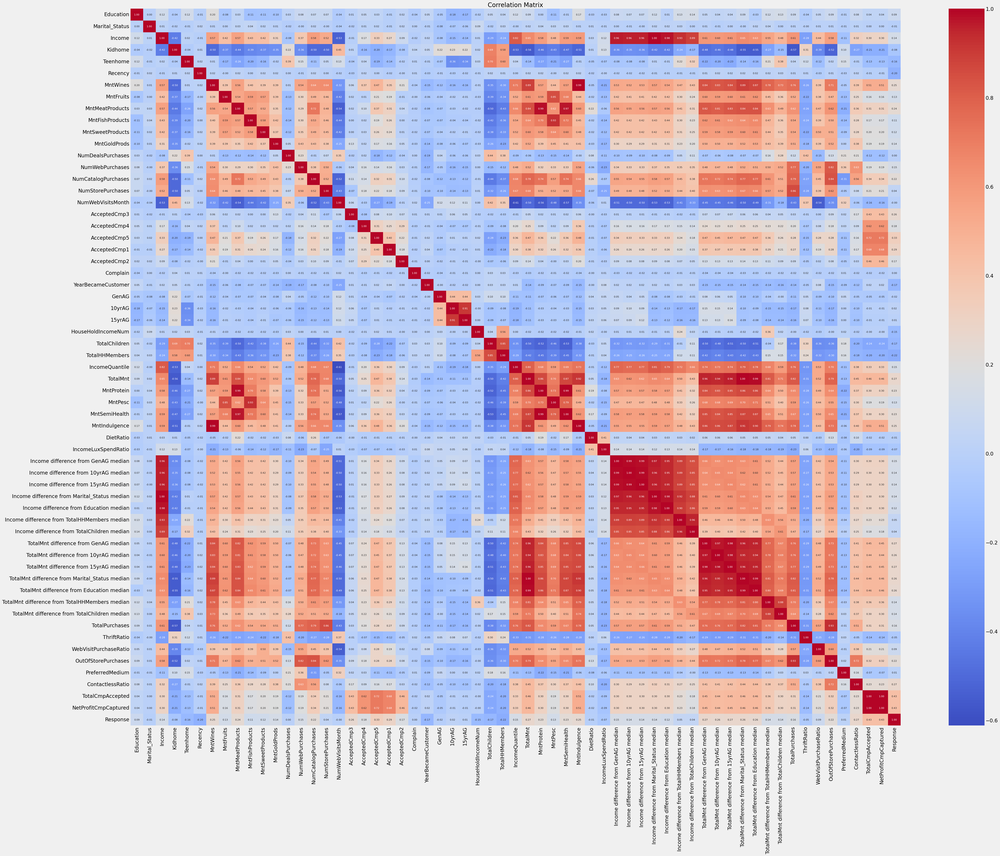

In [297]:
# for ease of reading, becomes really annoying to track in the middle
cols = [col for col in CustData.columns if col != 'Response']
cols.append('Response')
CustData = CustData[cols]

# correlation heatmap with numeric values
num_cols = CustData.select_dtypes(include=["number"]).columns
correlation_matrix = CustData[num_cols].corr()
plt.figure(figsize=(50, 40))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 8})
plt.title('Correlation Matrix')
plt.show()

#### Visualizing Data with a 6-D Scatterplot
While we will not be able to capture the full scope of the data, from reviewing the correlation heatmap and some exploratory gut instinct, these features will be my initial view into gaining insight into the data.


In [298]:
import plotly
import plotly.graph_objs as go
from sklearn.preprocessing import StandardScaler

markersize = (CustData['IncomeQuantile']+3) * 2
markercolor = CustData['Response'].replace(0,"blue").replace(1,"orange")
markershape = CustData['PreferredMedium'].replace(0,"square").replace(1,'circle').replace(2,'diamond')

plot_df = CustData.copy()
axis = ['TotalMnt','TotalPurchases','NetProfitCmpCaptured']
transform = StandardScaler()
plot_df[axis] = transform.fit_transform(plot_df[axis])

fig1 = go.Scatter3d(x=plot_df['TotalMnt'],
                    y=plot_df['TotalPurchases'],
                    z=plot_df['NetProfitCmpCaptured'],
                    marker={
                        'size': markersize,
                        'color': markercolor,
                        'symbol': markershape,
                        'opacity': 0.75,
                        'reversescale': True,
                        'colorscale': 'Blues',
                        'showscale':True,
                        'colorbar':{
                            'title':'Color - Campaign Response',
                            'titleside':'right'
                        }
                    },
                    line={"width":0.02},
                    mode='markers')

mylayout = go.Layout(scene={"xaxis":{"title":"Total Amount Spent w/ Company"},
                            "yaxis":{"title":"Total Amount of Purchasess"},
                            "zaxis":{"title":"Net Profit Previous Campaigns Captured"}},
                    )

plotly.offline.plot({"data": [fig1],
                     "layout": mylayout},
                     auto_open=True,
                     filename=(r"initial6Dplot.html"))

print("Completed")

Completed


    X: TotalMnt - Total Amount Spent
    Y: TotalPurchases
    Z: NetProfitCmpCaptured
    Size: IncomeQuantile
    Color: Response
        - 0: Not successful
        - 1: Successful
    Marker: PreferredMedium
        - 0: Catalog => Square
        - 1: Instore => Circle
        - 2: Web => X

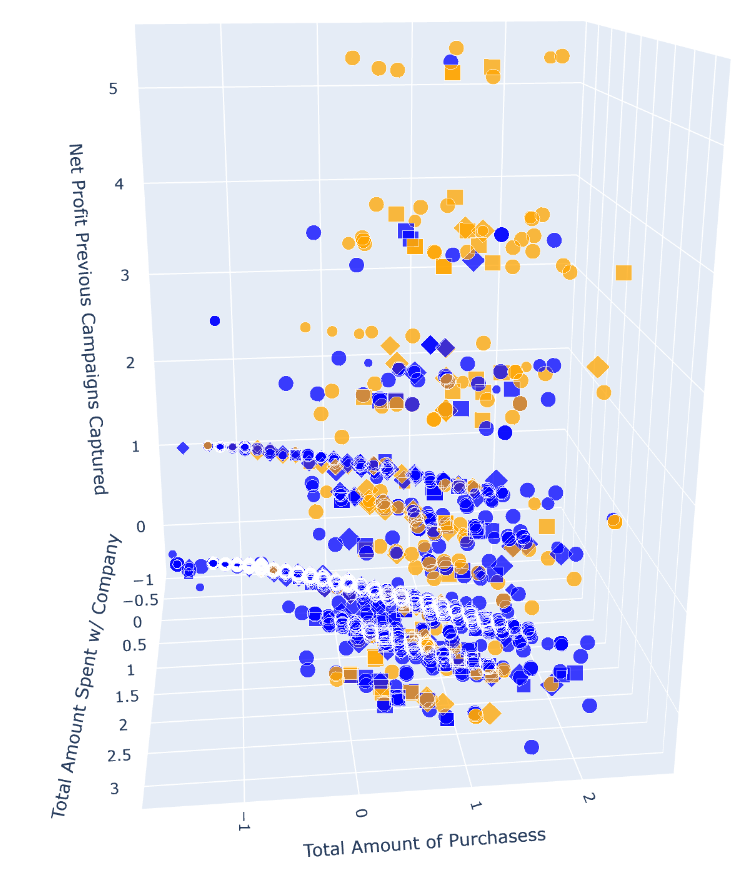

So as expected, the more campaigns accepted resulted in a higher correlation to a positive `Response` value. Squares and circles are far and away the more correlated values to a successful response, which leaves us looking at the catalog preferred medium. This seems to be a lot less correlated with successful campaign responses and in general have lower profit captured. 

The income quantile shows some tendency to have the lower quantiles of the `Income` feature to be less likely to accept campagins. However, the larger quantiles do not appear to be highly correlated with a succesful response.

Another interesting insight is another example of why looking at all angles of a problem is important... *literally*. When we look at `TotalMnt` spent, there is definitely a noticably higher concentration of blues (unsuccessful) on the left and oranges (successful) on the right. Now this is by now means some kind of decision boundary, but the response seems to correlate with the more money spent.

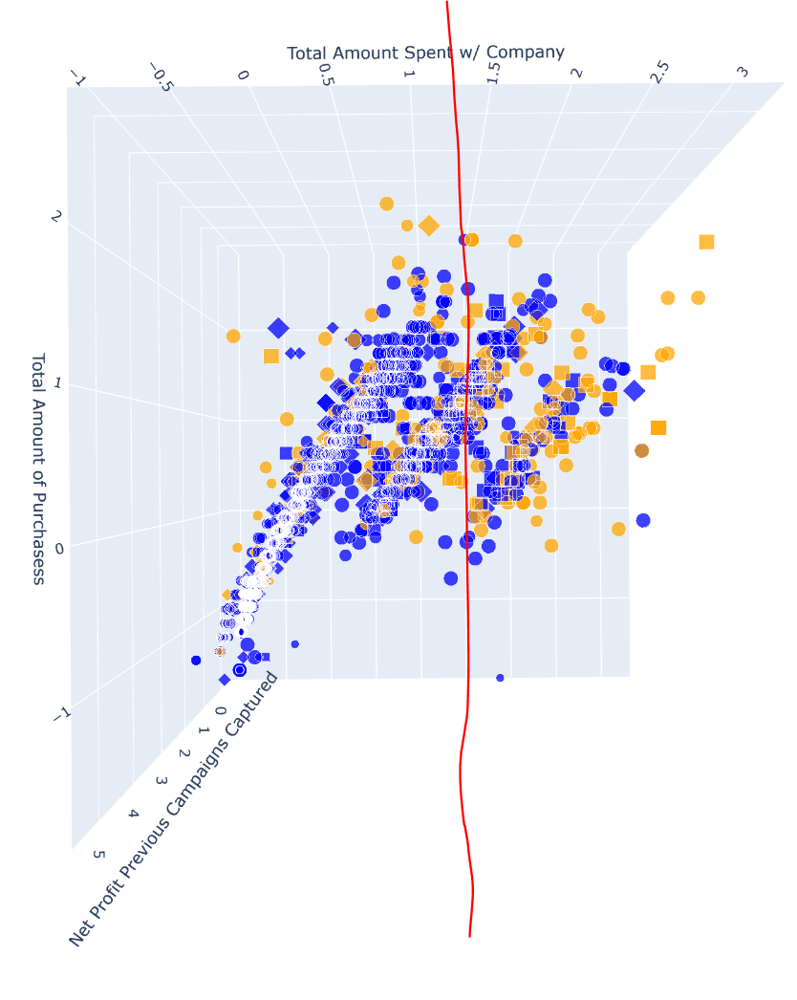

## Clustering
### Dimensionality Reduction with PCA

Quick check of data before we proceed.

In [299]:
CustData.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,YearBecameCustomer,GenAG,10yrAG,15yrAG,HouseHoldIncomeNum,TotalChildren,TotalHHMembers,IncomeQuantile,TotalMnt,MntProtein,MntPesc,MntSemiHealth,MntIndulgence,DietRatio,IncomeLuxSpendRatio,Income difference from GenAG median,Income difference from 10yrAG median,Income difference from 15yrAG median,Income difference from Marital_Status median,Income difference from Education median,Income difference from TotalHHMembers median,Income difference from TotalChildren median,TotalMnt difference from GenAG median,TotalMnt difference from 10yrAG median,TotalMnt difference from 15yrAG median,TotalMnt difference from Marital_Status median,TotalMnt difference from Education median,TotalMnt difference from TotalHHMembers median,TotalMnt difference from TotalChildren median,TotalPurchases,ThriftRatio,WebVisitPurchaseRatio,OutOfStorePurchases,PreferredMedium,ContactlessRatio,TotalCmpAccepted,NetProfitCmpCaptured,Response
0,2,2,58138.0,0,0,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,0,0,1,1,1,0,1,3,1617,718,260,806,723,1.114799,80.412172,819.5,1587.0,3415.0,10039.0,6544.0,-14003.5,-13928.0,1030.5,1073.0,1123.5,1256.0,1203.0,428.5,428.0,22,0.136364,1.142857,18,0,0.818182,0,-15,1
1,2,2,46344.0,1,1,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,2,0,1,0,1,2,3,2,27,8,3,9,12,0.750000,2726.117647,-10974.5,-10207.0,-13010.0,-1755.0,-5250.0,1184.0,2568.0,-559.5,-517.0,-610.0,-334.0,-387.0,-208.0,-66.0,4,0.500000,0.200000,2,1,0.500000,0,-15,0
2,2,3,71613.0,0,0,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,1,3,2,1,2,0,2,4,776,238,160,287,447,0.642058,153.019231,24502.0,17415.5,16890.0,20670.0,20019.0,11640.0,-453.0,497.0,310.5,282.5,384.0,362.0,30.0,-413.0,20,0.050000,2.000000,10,1,0.500000,0,-15,0
3,2,3,26646.0,1,0,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,2,1,4,2,2,1,3,1,53,30,14,34,14,2.428571,1665.375000,-12035.5,-12034.0,-16638.5,-24297.0,-24948.0,-18514.0,-20261.0,-112.0,-103.0,-150.5,-339.0,-361.0,-182.0,-252.0,6,0.333333,0.333333,2,1,0.333333,0,-15,0
4,4,1,58293.0,1,0,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,2,1,4,2,2,1,3,3,422,164,89,207,200,1.035000,310.069149,19611.5,19613.0,15008.5,6772.0,3281.0,13133.0,11386.0,257.0,266.0,218.5,25.5,-71.0,187.0,117.0,14,0.357143,1.000000,8,1,0.571429,0,-15,0


In [300]:
CustData.dtypes

Education                 int32
Marital_Status            int32
Income                  float64
Kidhome                   int64
Teenhome                  int64
                         ...   
PreferredMedium           int32
ContactlessRatio        float64
TotalCmpAccepted          int64
NetProfitCmpCaptured      int64
Response                  int64
Length: 61, dtype: object

Now that all of our values are numeric, let's begin PCA by scaling the data

In [301]:
from sklearn.decomposition import PCA

# print("All NaN and inf values in the DataFrame:")
# for col in CustData.columns:
#     if CustData[col].isna().any() or np.isinf(CustData[col]).any():
#         print(f"Column: {col}")
#         print(CustData[CustData[col].isna() | np.isinf(CustData[col])][col])
## nans were found in the ratios which appear to be divison by zero or nan issues: setting them to zero seems appropriate

CustData = CustData.replace([np.nan, np.inf, -np.inf], 0)
# scale the data for pca
transform = StandardScaler()
# remove Response from the scale but we will need it in CustData later during clustering
scaled_df = transform.fit_transform(CustData[[col for col in CustData.columns if col != 'Response']])

# to look at lost variance on principal components
pca_list = []
feature_weight_list = []

# looks at different ranges of feature reduction
for n in range(10, 30):
    pca = PCA(n_components=n)
    pca.fit(scaled_df)
    # append for visualition of explained variance retained versus num of dimensions
    pca_list.append(pd.Series({'n':n, 'model':pca,
                               'var': pca.explained_variance_ratio_.sum()}))
    # append for visualization of Feature importance in dimension reductions
    abs_feature_values = np.abs(pca.components_).sum(axis=0)
    feature_weight_list.append(pd.DataFrame({'n':n, 
                                             'features': CustData[[col for col in CustData.columns if col != 'Response']].columns,
                                             'values':abs_feature_values/abs_feature_values.sum()}))
    
pca_df = pd.concat(pca_list, axis=1).T.set_index('n')
features_df = (pd.concat(feature_weight_list).pivot(index='n', columns='features', values='values'))

Plotting the variance from 10-29. Initially I went as low as 4 and only as high 15 but there was way too much lost variance to consider these.

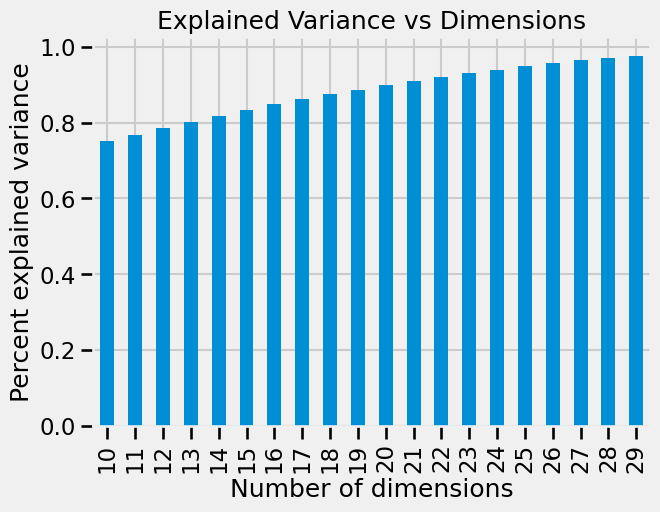

In [302]:
# let's see the variance
sns.set_context('talk')
ax = pca_df['var'].plot(kind='bar')

ax.set(xlabel='Number of dimensions',
       ylabel='Percent explained variance',
       title='Explained Variance vs Dimensions');

In [303]:
print(f"Features involved in PCA reduction: {len(CustData.columns)-1}")# remember we are keeping response in here

Features involved in PCA reduction: 60


In [304]:
with pd.option_context('display.max_rows', None):
    print(pca_df)

                   model       var
n                                 
10  PCA(n_components=10)  0.750396
11  PCA(n_components=11)  0.768128
12  PCA(n_components=12)  0.785228
13  PCA(n_components=13)  0.801961
14  PCA(n_components=14)  0.818445
15  PCA(n_components=15)  0.834402
16  PCA(n_components=16)  0.849833
17  PCA(n_components=17)   0.86307
18  PCA(n_components=18)   0.87525
19  PCA(n_components=19)  0.887293
20  PCA(n_components=20)  0.898883
21  PCA(n_components=21)  0.909838
22  PCA(n_components=22)   0.92011
23  PCA(n_components=23)  0.930014
24  PCA(n_components=24)  0.939482
25  PCA(n_components=25)  0.948653
26  PCA(n_components=26)  0.957093
27  PCA(n_components=27)    0.9641
28  PCA(n_components=28)  0.970703
29  PCA(n_components=29)  0.976883


So I think that considering the curse of dimensionality while minimizing variance, 17 is the perfect number. While there isn't a distinct elbow, analyzing the differences here between each dimension makes me believe that 17 is great step for reduced dimensionality AND .86 variance retention with progressively larger jumps in loss of variance makes this a very justified choice. 

I am also going to try 25 to see if maximzing the retention of variance and giving up some dimensionality will be interesting to look at.

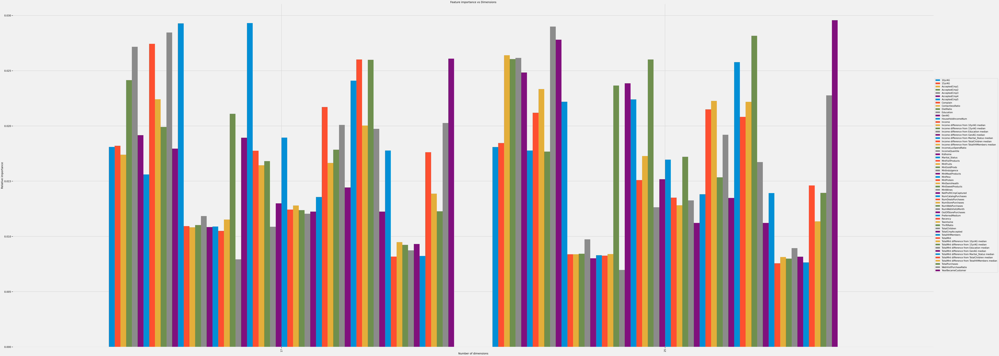

In [305]:
# # this plot is kind of hard to see so I am going to reduce it 17:25
features_df = features_df.iloc[7:-4]
# and then now let's jist keep the important ones since we are just trying to look at these bois
features_df = features_df.iloc[[0, -1]]


ax = features_df.plot(kind='bar', figsize=(100,40),width=0.9)
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize='small')
ax.set(xlabel='Number of dimensions',
       ylabel='Relative importance',
       title='Feature importance vs Dimensions');

In [306]:
features_df

features,10yrAG,15yrAG,AcceptedCmp1,AcceptedCmp2,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,Complain,ContactlessRatio,DietRatio,Education,GenAG,HouseHoldIncomeNum,Income,Income difference from 10yrAG median,Income difference from 15yrAG median,Income difference from Education median,Income difference from GenAG median,Income difference from Marital_Status median,Income difference from TotalChildren median,Income difference from TotalHHMembers median,IncomeLuxSpendRatio,IncomeQuantile,Kidhome,Marital_Status,MntFishProducts,MntFruits,MntGoldProds,MntIndulgence,MntMeatProducts,MntPesc,MntProtein,MntSemiHealth,MntSweetProducts,MntWines,NetProfitCmpCaptured,NumCatalogPurchases,NumDealsPurchases,NumStorePurchases,NumWebPurchases,NumWebVisitsMonth,OutOfStorePurchases,PreferredMedium,Recency,Teenhome,ThriftRatio,TotalChildren,TotalCmpAccepted,TotalHHMembers,TotalMnt,TotalMnt difference from 10yrAG median,TotalMnt difference from 15yrAG median,TotalMnt difference from Education median,TotalMnt difference from GenAG median,TotalMnt difference from Marital_Status median,TotalMnt difference from TotalChildren median,TotalMnt difference from TotalHHMembers median,TotalPurchases,WebVisitPurchaseRatio,YearBecameCustomer
n,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
17,0.018096,0.018209,0.017399,0.024140,0.027159,0.019165,0.015609,0.027428,0.022414,0.019906,0.028459,0.017942,0.029277,0.010934,0.010827,0.011024,0.011838,0.010846,0.010891,0.010496,0.011522,0.021093,0.007921,0.018930,0.029313,0.017749,0.016437,0.016816,0.010871,0.012989,0.018944,0.012425,0.012799,0.012375,0.012056,0.012240,0.013570,0.021713,0.016647,0.017846,0.020095,0.014432,0.024099,0.026012,0.020032,0.025986,0.019734,0.012240,0.017775,0.008171,0.009481,0.009233,0.008739,0.009314,0.008229,0.017617,0.013873,0.012270,0.020260,0.026093
25,0.018085,0.018457,0.026401,0.026052,0.026155,0.024832,0.017775,0.021194,0.023341,0.017677,0.028995,0.027807,0.022191,0.008381,0.008379,0.008430,0.009738,0.008022,0.008301,0.008258,0.008397,0.023660,0.006960,0.023855,0.022397,0.015101,0.017278,0.026017,0.012639,0.015172,0.016952,0.013513,0.012816,0.017211,0.013256,0.011221,0.013811,0.021500,0.022262,0.015345,0.019198,0.013481,0.025774,0.020820,0.022181,0.028163,0.016725,0.011221,0.013920,0.007567,0.008133,0.007993,0.008941,0.008158,0.007648,0.014613,0.011361,0.013942,0.022763,0.029567


#### Reviewing Feature Importances in Reduced Dimensions `17` and `25`
Now the results are actually quite interesting. In both cases, the least important values in retaining variance were: `Income difference from Education Median`,`TotalMnt`,`IncomeQuantiles`. Now these were derived features so it does make some sense, but certainly interesting they were both the same.

The 3 most important features for retaining variance at **17** dimension is: `HouseHoldIncomeNum`, `Income difference from Martial_Status median`, and `Education`. For **25** it is: `Education`, `YearBecameCustomer`,and `ThirftRatio`

In [307]:
# 17
pca = PCA(n_components=17)
pca_result = pca.fit_transform(scaled_df)
pca17_df = pd.DataFrame(data=pca_result, columns=[f"PC{n+1}" for n in range(pca_result.shape[1])])
# 25
pca = PCA(n_components=25)
pca_result = pca.fit_transform(scaled_df)
pca25_df = pd.DataFrame(data=pca_result, columns=[f"PC{n+1}" for n in range(pca_result.shape[1])])

### Clustering Methods
#### K-Means Clustering
I think the lowest value would be 3 for a bronze, silver, and gold standard customer, but it does not hurt to look at just two clusters. I am going to run this through a loop because we might be able to find even more distinct personalities. While I think 15 would be overfitted, I want to see a broad spectrum to compare the elbow methods to.

In [308]:
from sklearn.cluster import KMeans

inertia17 = {}
inertia25 = {}

for n in range(2,16):
    km = KMeans(n_clusters=n,random_state=0)
    # for 17 pc
    km.fit(pca17_df)
    labels = km.labels_
    pca17_df[f"KMeans-{n} Cluster"] = labels
    # for elbow plot
    inertia17[n] = km.inertia_
    # for 25 pc
    km.fit(pca25_df)
    labels = km.labels_
    # for elbow plot
    inertia25[n] = km.inertia_
    pca25_df[f"KMeans-{n} Cluster"] = labels

Let's plot the elbow method to see how what the technical optimal value is.

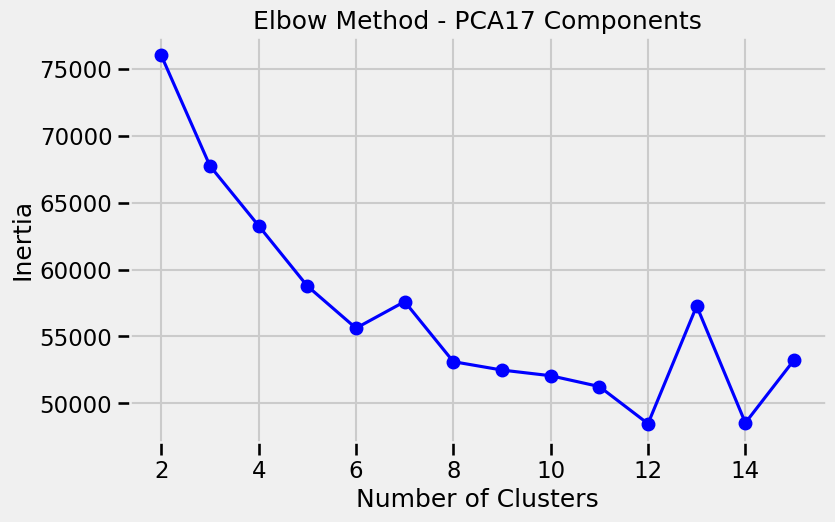

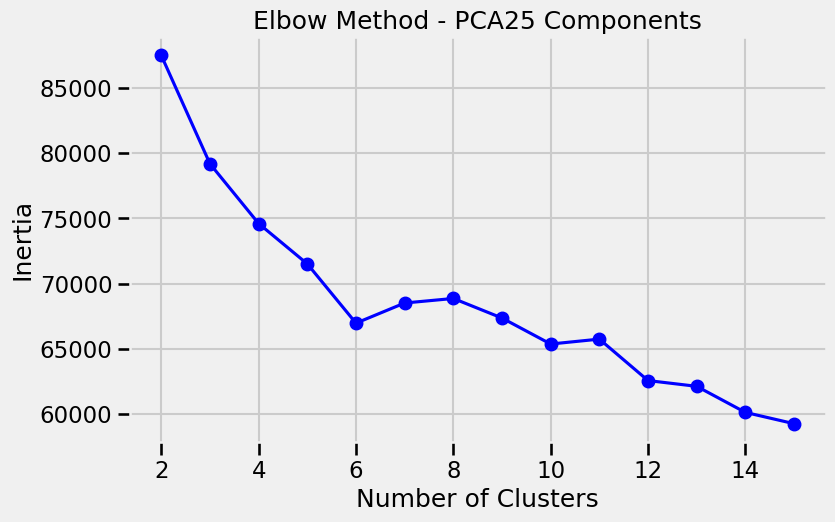

In [310]:
import os

def plot_elbow_method(inertia_values, pca_label, save_directory):
    # create plot for inertia
    plt.figure(figsize=(8, 5))
    plt.plot(list(inertia_values.keys()), list(inertia_values.values()), 'bo-')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Inertia')
    plt.title(f'Elbow Method - {pca_label} Components')
    # save plot
    plt.savefig(f"{save_directory}/{pca_label}_Elbow_Plot.png")

save_dir = "ClusteringMethodsVisz/Elbow Plots"
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
plot_elbow_method(inertia17,"PCA17",save_dir)
plot_elbow_method(inertia25,"PCA25",save_dir)

#### Inertia in PCA 17 & 25
##### 17
So we see an initial inflection at 4 but 5-6 create a drop which then truly flattens. I will look at 4-6 just for care.

##### 25
This one has a much clearer elbow at 6, so I think this would be best.

#### Plotting the clusters to a scatterplot
I also thought the initial tiering of the axis of the first plot was really interesting and want to see how this would be affected with the clustering. Then we will also make our PCA Axis since this is probably the more insightful view to the actual clustering structure.

The results will be attached in `ClusteringMethod6Dvisz` folder attached in this repo. I will review the most insightful results below.

In [311]:
def plot_clusters_to_6D(axis_df:pd.DataFrame,response:list,num_clu:int,pc_num:int,clustering_method:str,cluster_df=None):
    """
    Plot clusters on 6D scatterplot
    Input:
    -- axis_df: DataFrame we want to set axis to
    -- response: Binary variable of success of marketing campaign
    -- num_clu: How many clusters were plotted
    -- pc_num: Tracking which PCs are used
    -- clustering_method: ["kmeans","hagg","dbscan"]
    -- cluster_df: DataFrame with clustering data
       - If these are contained in the same df, just set axis_df
    Output:
    Saves a file with a 6-D scatter plot analyzing the response and clustering methods based on the dataframes passed
    """
    if clustering_method not in ["kmeans","hagg","dbscan"]:
        print(r'Please set `clustering_method` to one of the following: ["kmeans","hagg","dbscan"]')
    # checking inputs
    if num_clu is None:
        raise ValueError("Value for num_clu not set")
    if response is None:
        raise ValueError("Value for response not set")
    if axis_df is None:
        raise ValueError("axis_df is required")
    if cluster_df is None:
        cluster_df = axis_df

    # setting visz properties
    if "Education" in axis_df.columns:
        # since education was critical in both pca breakdowns for retaining variance
        markersize = (axis_df['Education']+2) * 3
    else:
        # pc4 # absolute value and add 1 so it ensures no negatives, zero values, and anything below 0.5 would be really hard to see even x3
        min_ = axis_df["PC4"].min()
        max_ = axis_df["PC4"].max()
        markersize = ((axis_df["PC4"] - min_)/(max_-min_)*3)*10
    if "Response" in axis_df.columns:
        markercolor = response.replace(0,"blue").replace(1,"orange")
        colortitle= 'Color - Campaign Response'
    else:
        markercolor = cluster_df["PC5"]
        colortitle= "Principal Component 5 Value"
    if clustering_method == "kmeans":
        markershape = (
            cluster_df[f'KMeans-{num_clu} Cluster'].replace(0,"square").replace(1,'circle')
            .replace(2,'diamond-open').replace(3,'x').replace(4,'square-open').replace(5,'diamond')
        )
    elif clustering_method == "hagg":
        markershape = (
            cluster_df[f'HAgg - {num_clu} Clusters'].replace(0,"square").replace(1,'circle')
            .replace(2,'diamond-open').replace(3,'x').replace(4,'square-open').replace(5,'diamond')
        )
    else:
        markershape = (
            cluster_df[f'DBSCAN w {num_clu} Clusters'].replace(0,"square").replace(1,'circle')
            .replace(2,'diamond-open').replace(3,'x').replace(4,'square-open').replace(5,'diamond').replace(-1,"cross")
        )
        
    # creating the axis
    plot_df = axis_df.copy()
    if 'TotalMnt' in axis_df.columns:
        # the visualization almost was a segmentation visually so I really want to see how these are doing
        axis = ['TotalMnt','TotalPurchases','NetProfitCmpCaptured']
    else:
        # pc: 1,2,3
        axis = ['PC1','PC2','PC3']

    transform = StandardScaler()
    plot_df[axis] = transform.fit_transform(plot_df[axis])
    # plot the figure
    fig1 = go.Scatter3d(x=plot_df[axis[0]],
                        y=plot_df[axis[1]],
                        z=plot_df[axis[2]],
                        marker={
                            'size': markersize,
                            'color': markercolor,
                            'symbol': markershape,
                            'opacity': 0.75,
                            'reversescale': True,
                            'colorscale': 'Viridis',
                            'showscale':True,
                            'colorbar':{
                                'title':colortitle,
                                'titleside':'right'
                            }
                        },
                        line={"width":0.02},
                        mode='markers')
    
    # proper titling and save for each
    if 'TotalMnt' in plot_df.columns: # analyzing clustering compared to important company metrics
        save_folder = r"ClusteringMethodsVisz/6DInitAxis/"
        if clustering_method == "kmeans":
            mylayout = go.Layout(scene={"xaxis":{"title":"Total Amount Spent w/ Company"},
                                        "yaxis":{"title":"Total Amount of Purchasess"},
                                        "zaxis":{"title":"Net Profit Previous Campaigns Captured"}},
                                )
            plotly.offline.plot({"data": [fig1],
                             "layout": mylayout},
                             auto_open=True,
                             filename=(fr"{save_folder}IA-PCA{pc_num}-Kmeans{num_clu}-6Dplot.html"))
        elif clustering_method == "hagg":
            mylayout = go.Layout(scene={"xaxis":{"title":"Total Amount Spent w/ Company"},
                                        "yaxis":{"title":"Total Amount of Purchasess"},
                                        "zaxis":{"title":"Net Profit Previous Campaigns Captured"}},
                                )
            plotly.offline.plot({"data": [fig1],
                             "layout": mylayout},
                             auto_open=True,
                             filename=(fr"{save_folder}IA-PCA{pc_num}-WardHagg-{num_clu}-6Dplot.html"))
        else:
            mylayout = go.Layout(scene={"xaxis":{"title":"Total Amount Spent w/ Company"},
                                        "yaxis":{"title":"Total Amount of Purchasess"},
                                        "zaxis":{"title":"Net Profit Previous Campaigns Captured"}},
                                )
            plotly.offline.plot({"data": [fig1],
                             "layout": mylayout},
                             auto_open=True,
                             filename=(fr"{save_folder}IA-PCA{pc_num}-DBSCANw{num_clu}Clusters-6Dplot.html"))
    
    else: # analyzing the clustering with 5 PCA dimensions
        save_folder = r"ClusteringMethodsVisz/6DPCAAxis/"
        # plot PCA axis with KMeans clustering
        if clustering_method == "kmeans":
            mylayout = go.Layout(scene={
                                    "xaxis": {"title": "Principal Component 1"},
                                    "yaxis": {"title": "Principal Component 2", "range": [-5, 5]},  # for better clustering inspection
                                    "zaxis": {"title": "Principal Component 3", "range": [-5, 5]}   # ^^
                                })
            plotly.offline.plot({"data": [fig1],
                             "layout": mylayout},
                             auto_open=True,
                             filename=(fr"{save_folder}PCA{pc_num}-Kmeans{num_clu}-6Dplot.html"))
        # plot PCA axis with HAgg clustering
        elif clustering_method == "hagg":
            mylayout = go.Layout(scene={
                                    "xaxis": {"title": "Principal Component 1"},
                                    "yaxis": {"title": "Principal Component 2", "range": [-5, 5]},  # for better clustering inspection
                                    "zaxis": {"title": "Principal Component 3", "range": [-5, 5]}   # ^^
                                })
            plotly.offline.plot({"data": [fig1],
                             "layout": mylayout},
                             auto_open=True,
                             filename=(fr"{save_folder}PCA{pc_num}-WardHagg-{num_clu}-6Dplot.html"))
        # plot PCA axis with DBSCAN clustering
        else:
            mylayout = go.Layout(scene={
                                    "xaxis": {"title": "Principal Component 1"},
                                    "yaxis": {"title": "Principal Component 2", "range": [-5, 5]},  # for better clustering inspection
                                    "zaxis": {"title": "Principal Component 3", "range": [-5, 5]}   # ^^
                                })
            plotly.offline.plot({"data": [fig1],
                             "layout": mylayout},
                             auto_open=True,
                             filename=(fr"{save_folder}PCA{pc_num}-DBSCANw{num_clu}Clusters-6Dplot.html"))
    # verification
    print("Completed")

folder = "ClusteringMethodsVisz/6DPCAAxis"
if not os.path.exists(folder):
    os.makedirs(folder)
folder = "ClusteringMethodsVisz/6DInitAxis"
if not os.path.exists(folder):
    os.makedirs(folder)

# based on PCA-17
for n in range(4,7):
    plot_clusters_to_6D(CustData,CustData["Response"],n,17,"kmeans",pca17_df)
    plot_clusters_to_6D(pca17_df,CustData["Response"],n,17,"kmeans")
# based on PCA-25
plot_clusters_to_6D(CustData,CustData["Response"],6,25,"kmeans",pca25_df)
plot_clusters_to_6D(pca25_df,CustData["Response"],6,25,"kmeans")


Completed
Completed
Completed
Completed
Completed
Completed
Completed
Completed


##### Results for Initial Plot Axis
They mostly performed adequately in terms of capturing a high number of good responses. K-means clustering with `k=4` based on 17 principal components seemed to perform well with creating reasonable tiers of different customers we might want to look into. The solid circle seemed to have higher previous campaign successes and more likely to respond positively in `Response` to the new campaign. This defintely a good start to getting solid customer personas.

    Legend of the Plot
    X: TotalMnt - Total Amount Spent
    Y: TotalPurchases
    Z: NetProfitCmpCaptured
    Size: (Education + 2)*3
        - 0: 2n Clycle
        - 1: Basic
        - 2: Graduation
        - 3: Master
        - 4: PHD
    Color: Response
        - 0: Not successful
        - 1: Successful
    Marker: Cluster
        - 0: Square
        - 1: Circle
        - 2: Diamond-Open
        - 3: X

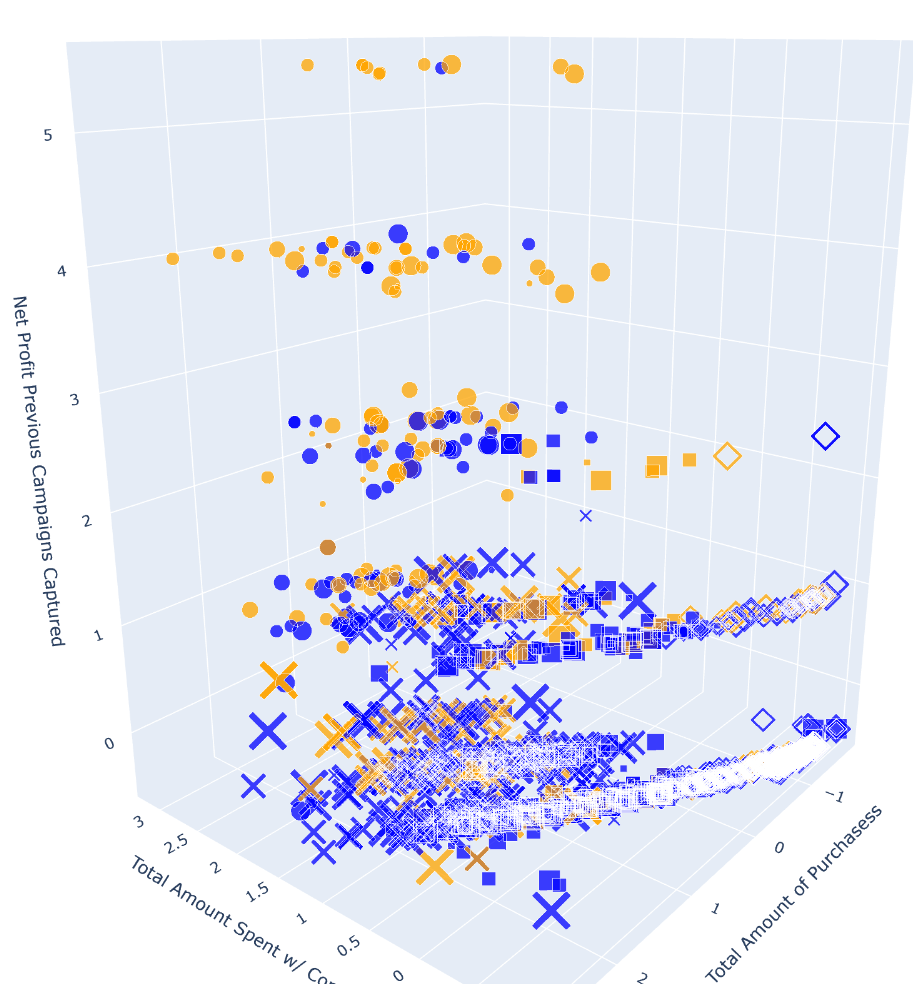

And if you look at this from the top to put `Total Amount Spent w/ Company` in better view, we can see most of these circles are in the positive standard deviations.

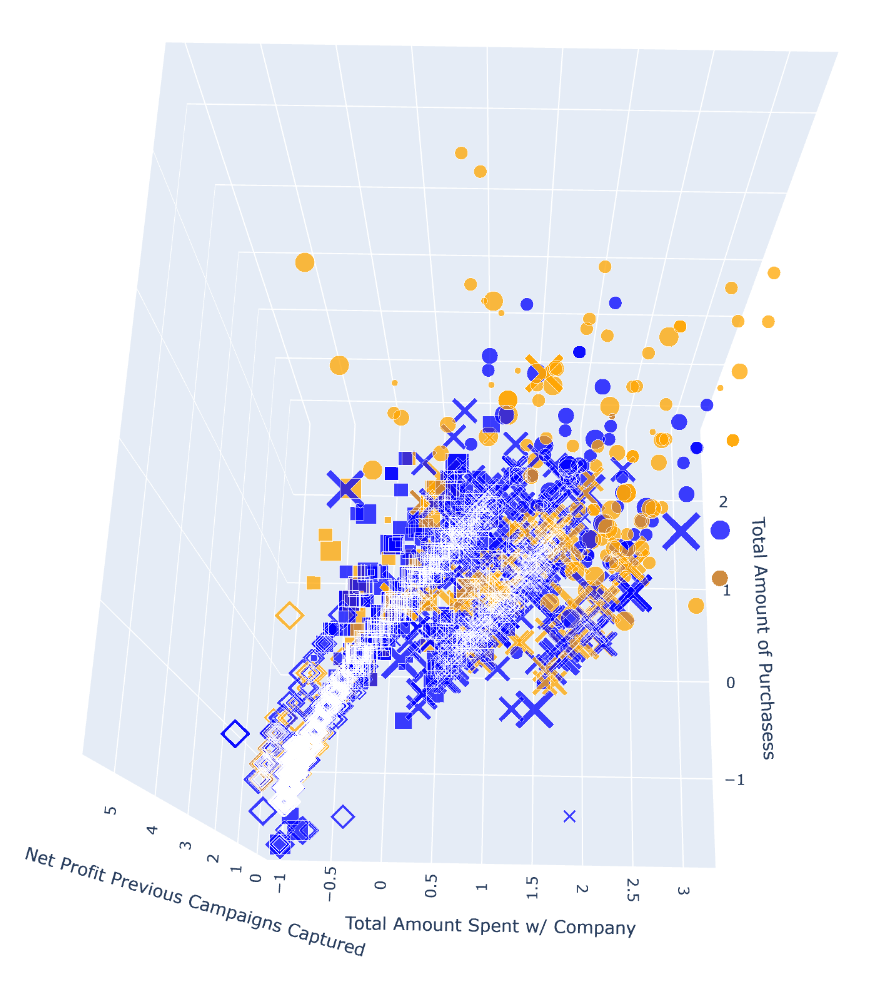

Finally, we can also see they tend to purchase ***more items*** as well.

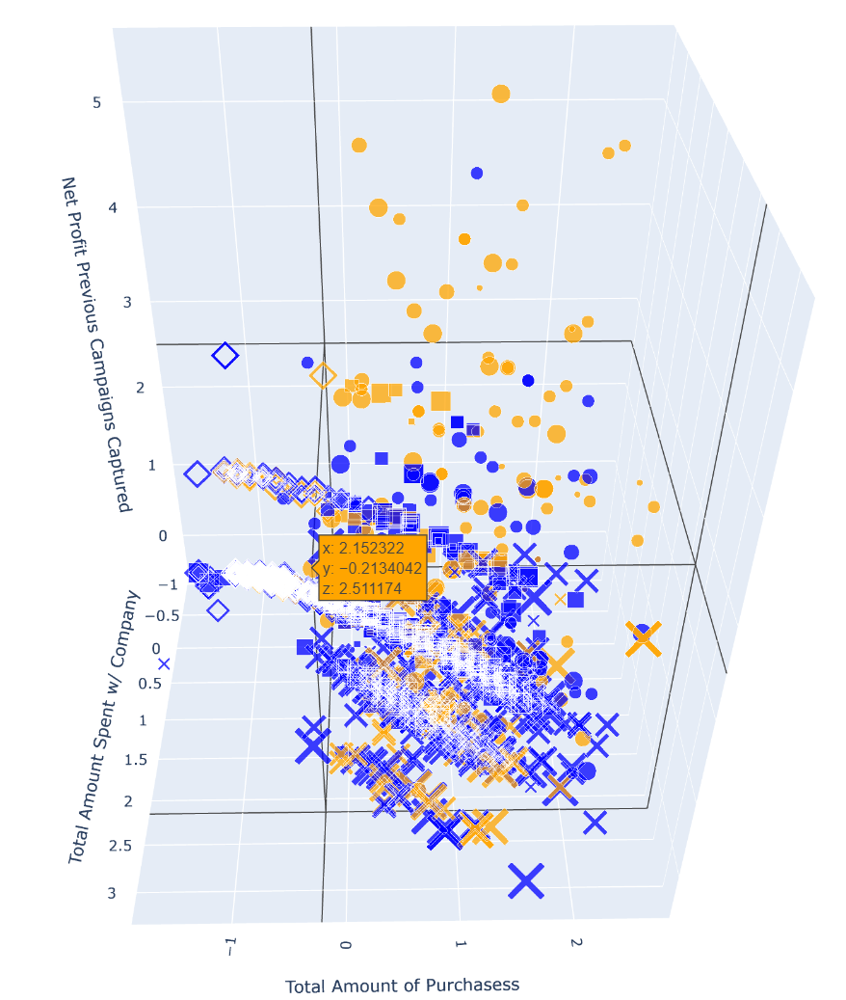

In addition, we see X's are more in line with customers who we should not focus as much on. They have historically not received our campaigns well, as our cost of contacting them is almost exclusively negative in terms of the `Net Profit Previous Campaigns Captured`

I think these clustering parameters would be the best of in getting good segmentation in an understandable way.

##### Results for analyzing the clustering by the 5 first principal components involved
Continue looking at the structure for the 4 clusters in the PCA-17 dataframe. This is hard to show in one image, but the clusters are reasonably seperated. There is definitely contains clusters which could be seperated better but

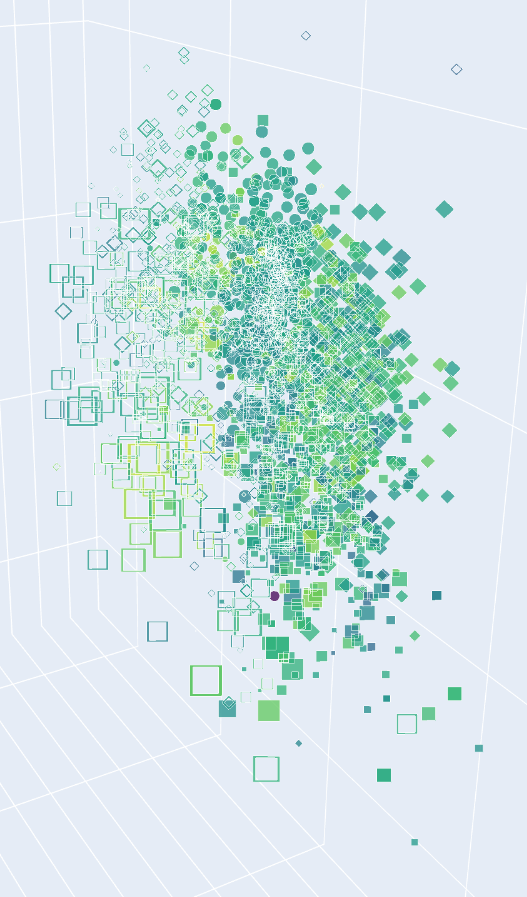

However, more importantly the visualization reveals there seems to be a relatively spherical shape and contains varying densities. We also saw in the function the axes needed to be restricted due to outliers. This makes me believe we need to add DBSCAN to clustering methods to explore.

#### Ward-Hierarchal Agglomerative Clustering
So this is another clustering method I think would naturally make sense for a bronze-silver-gold rank customer segmentation for the campaign response. This might not get as distinct as K-Means for building the personas of the company, but I think it is still worth looking at.

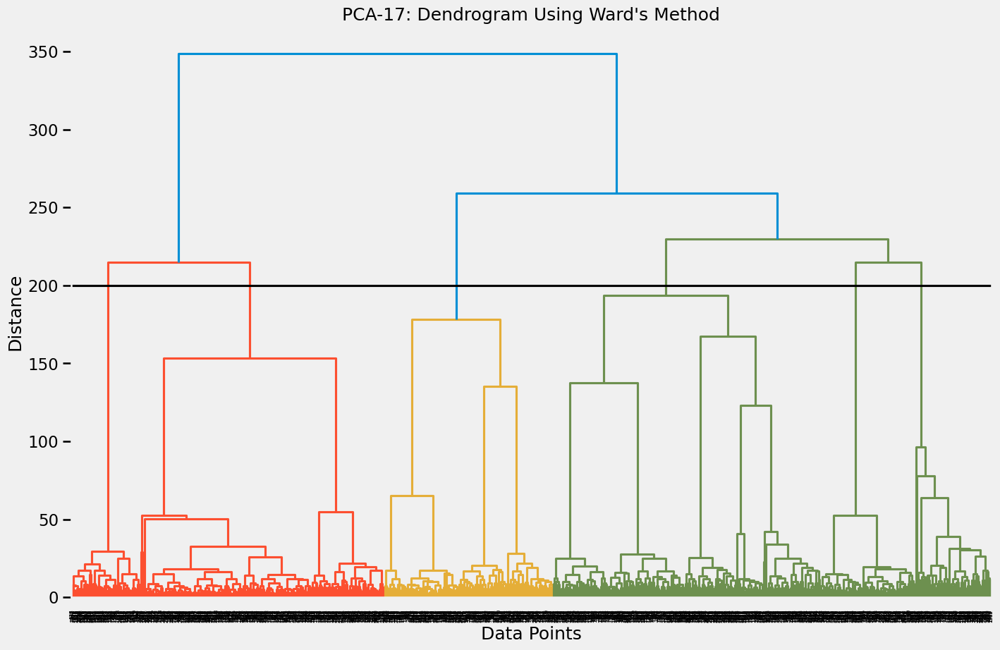

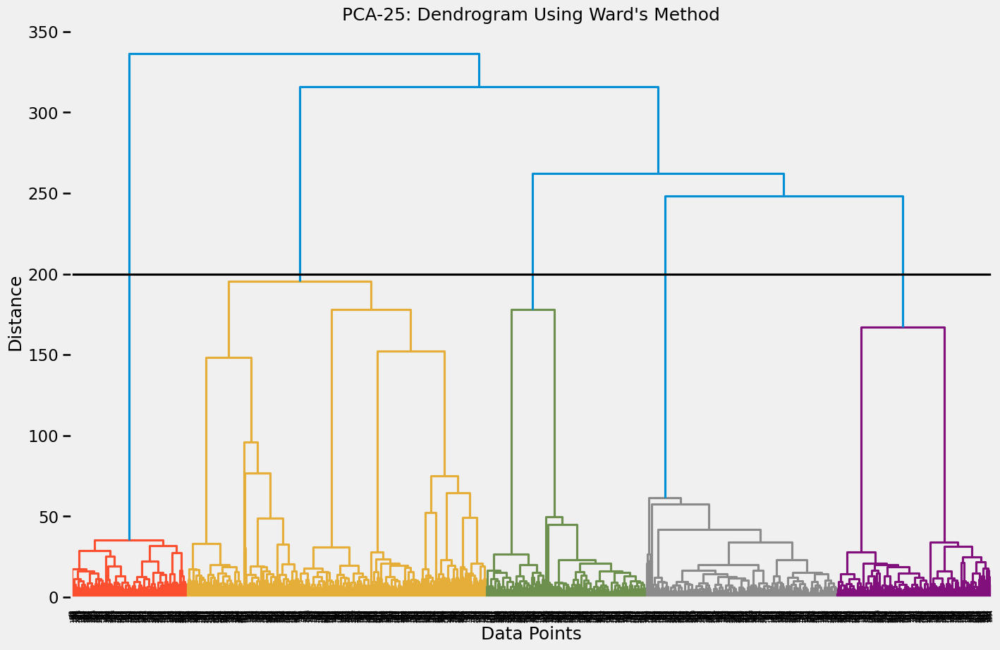

In [312]:
import scipy.cluster.hierarchy as sch

folder = r"ClusteringMethodsVisz/HAgg Dendrogram"
if not os.path.exists(folder):
    os.makedirs(folder)

# plot the dendrogram for 17 dimensions
plt.figure(figsize=(15, 10))
plt.grid(False)
dend17 = sch.dendrogram(sch.linkage(pca17_df,"ward"))
plt.axhline(y=200,color='black')
plt.title("PCA-17: Dendrogram Using Ward's Method")
plt.xlabel("Data Points")
plt.ylabel("Distance")
plt.savefig(f"{folder}/PCA17-dendrogram.png", dpi=300, bbox_inches='tight')
plt.show()
# plot the dendrogram for 25 dimensions
plt.figure(figsize=(15, 10))
plt.grid(False)
dend17 = sch.dendrogram(sch.linkage(pca25_df,"ward"))
plt.axhline(y=200,color='black')
plt.title("PCA-25: Dendrogram Using Ward's Method")
plt.xlabel("Data Points")
plt.ylabel("Distance")
plt.savefig(f"{folder}/PCA25-dendrogram.png", dpi=300, bbox_inches='tight')
plt.show()

With this initial delimiter at 200, I think both of these are very reasonable clustering options at `6` for PCA-17 and `5` for PCA-25. But I also think for the PCA-17, had you set the line at 250, this reveals 3 is also able to create well seperated clusters. Same goes for PCA-25 with `3`. Let's look at both options for each.

In [313]:
from sklearn.cluster import AgglomerativeClustering

for n in [3,6]:
    ward = AgglomerativeClustering(n_clusters=n, linkage='ward')
    labels = ward.fit_predict(pca17_df)
    pca17_df[f'HAgg - {n} Clusters'] = labels
    plot_clusters_to_6D(CustData,CustData["Response"],n,17,"hagg",pca17_df)
    plot_clusters_to_6D(pca17_df,CustData["Response"],n,17,"hagg")


for n in [3,5]:
    ward = AgglomerativeClustering(n_clusters=n, linkage='ward')
    labels = ward.fit_predict(pca25_df)
    pca25_df[f'HAgg - {n} Clusters'] = labels
    plot_clusters_to_6D(CustData,CustData["Response"],n,25,"hagg",pca25_df)
    plot_clusters_to_6D(pca25_df,CustData["Response"],n,25,"hagg")

Completed
Completed
Completed
Completed
Completed
Completed
Completed
Completed


#### Evaluating Ward-HAgg results
Now again, this can be hard to view in one single screenshot, so I encourage you to view these yourselves or experiment. 

But the most apparent insight is that 3 clusters is ***wayyy*** off. From reviewing both the initial axis and PCA axis, we can see in the visualizations there is a lot less entropy when using 3 for either amount of Principal Components. 

With 17 principal components, 6 clusters is performing relatively well, as there are much more linearly seperable clusters. The screenshot does not due it justicem but go to the file and manuever around- it is doing considerably better than the rest of Ward-HAgg Clusterings. Looking at initial plotted axis, the `X`s or the *4th cluster*, are performing pretty well to capture high purchase total & frequency based customers! I would select the KMeans clustering over this still visually.

Looking at how the clustering was formed with the context of the first 5 PC, we see this is performing reasonably well to seperate clusters, albeit there is definitely crossover.

##### PCA Axis
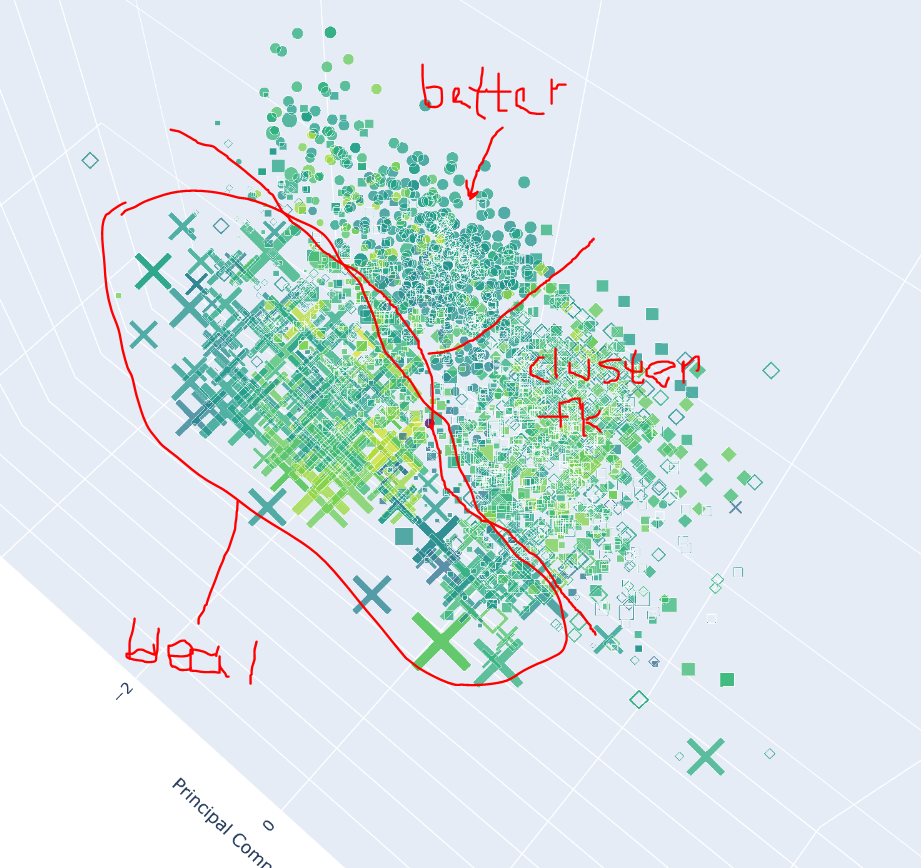

##### Init Axis
    Legend of the Plot
    X: TotalMnt - Total Amount Spent
    Y: TotalPurchases
    Z: NetProfitCmpCaptured
    Size: (Education + 2)*3
        - 0: 2n Clycle
        - 1: Basic
        - 2: Graduation
        - 3: Master
        - 4: PHD
    Color: Response
        - 0: Not successful
        - 1: Successful
    Marker: Cluster
        - 0: Square
        - 1: Circle
        - 2: Diamond-Open
        - 3: X
        - 4: Square-Open
        - 5: Diamond

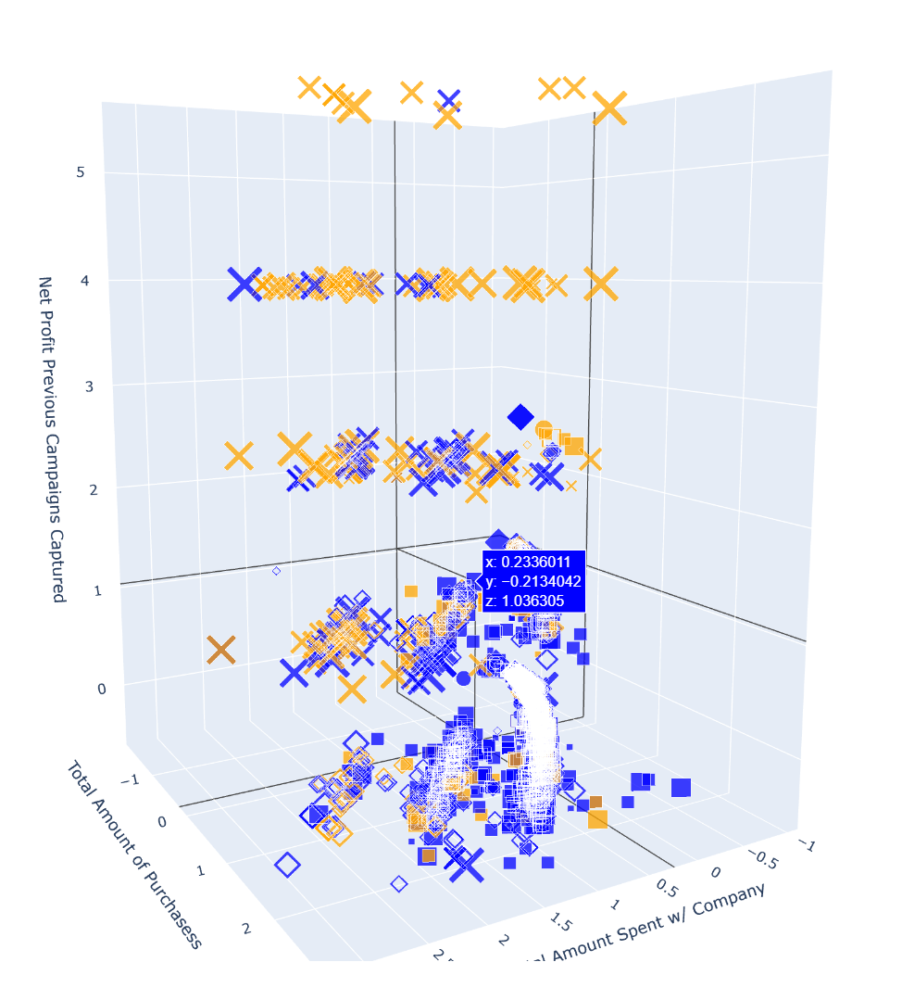

#### DBSCAN
I know this adds no value, and probably am setting myself for disappointed expectations, but I feel like DBSCan is going to be the correct clustering method here. My initial hunch is based on observations of the data:
- Data relatively spherical
- Data has varying densities
- Data has outliers

So let's see if my hunch is verified with the data!

In [314]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

dbs_pca17_results = pd.DataFrame(columns=["Epsilon","Min_Samples","Silhouette_Score","CalHar_Score","DavBoi_Score","NoisePoints","TotalClusters"])
dbs_pca25_results = pd.DataFrame(columns=["Epsilon","Min_Samples","Silhouette_Score","CalHar_Score","DavBoi_Score","NoisePoints","TotalClusters"])

for e in np.arange(3,13,0.1):
    for mn in range(10,75):
        dbs = DBSCAN(eps=e,min_samples=mn)
        dbs.fit_predict(pca17_df)
        n_noise = np.sum(dbs.labels_ == -1)
        n_clusters = len(set(dbs.labels_)) - (1 if -1 in dbs.labels_ else 0)
        # scores need more than one cluster
        if n_clusters <= 1:
            continue
        # for dataframe
        silhouette_avg = silhouette_score(pca17_df, dbs.labels_)
        ch_score = calinski_harabasz_score(pca17_df, dbs.labels_)
        db_score = davies_bouldin_score(pca17_df, dbs.labels_)
        dbs_pca17_results.loc[len(dbs_pca17_results)] = [e, mn, silhouette_avg, ch_score, db_score, n_noise, n_clusters]

for e in np.arange(5,15,0.1):
    for mn in range(15,90):
        dbs = DBSCAN(eps=e,min_samples=mn)
        dbs.fit_predict(pca25_df)
        n_noise = np.sum(dbs.labels_ == -1)
        n_clusters = len(set(dbs.labels_)) - (1 if -1 in dbs.labels_ else 0)
        # scores need more than one cluster
        if n_clusters <= 1:
            continue
        # for dataframe
        silhouette_avg = silhouette_score(pca25_df, dbs.labels_)
        ch_score = calinski_harabasz_score(pca25_df, dbs.labels_)
        db_score = davies_bouldin_score(pca25_df, dbs.labels_)
        dbs_pca25_results.loc[len(dbs_pca25_results)] = [e, mn, silhouette_avg, ch_score, db_score, n_noise, n_clusters]

In [315]:
dbs_eval = dbs_pca17_results[
    ((dbs_pca17_results["Silhouette_Score"] > 0.4) & 
    (dbs_pca17_results["DavBoi_Score"] < 1.3))
]
dbs_eval = dbs_eval.sort_values(by="DavBoi_Score",ascending=True)
print(len(dbs_eval))
with pd.option_context('display.max_rows', None):
    print(dbs_eval[:100])

105
      Epsilon  Min_Samples  Silhouette_Score  CalHar_Score  DavBoi_Score  \
1397      5.2         43.0          0.478776    508.699698      1.111586   
1399      5.2         45.0          0.477365    503.230673      1.116772   
1398      5.2         44.0          0.477365    503.230673      1.116772   
1329      5.1         40.0          0.475023    497.689565      1.124939   
1330      5.1         41.0          0.474009    495.199969      1.128259   
1331      5.1         42.0          0.472570    491.805914      1.131795   
1333      5.1         44.0          0.471182    487.188991      1.135061   
1332      5.1         43.0          0.471182    487.188991      1.135061   
1334      5.1         45.0          0.470128    484.307536      1.137872   
1260      5.0         36.0          0.469780    483.642920      1.141045   
1261      5.0         37.0          0.468776    481.304490      1.144073   
1262      5.0         38.0          0.468327    480.373129      1.144936   
1263    

In [316]:
dbs_eval = dbs_pca25_results[
    ((dbs_pca25_results["Silhouette_Score"] > 0.51) & 
    (dbs_pca25_results["DavBoi_Score"] < 1.17))
]
dbs_eval = dbs_eval.sort_values(by="DavBoi_Score",ascending=True)
print(len(dbs_eval))
with pd.option_context('display.max_rows', None):
    print(dbs_eval[:100])

23
      Epsilon  Min_Samples  Silhouette_Score  CalHar_Score  DavBoi_Score  \
3586      9.7         76.0          0.519649    735.688146      1.163029   
3672      9.8         87.0          0.519649    735.688146      1.163029   
3671      9.8         86.0          0.519649    735.688146      1.163029   
3670      9.8         85.0          0.519649    735.688146      1.163029   
3669      9.8         84.0          0.519649    735.688146      1.163029   
3668      9.8         83.0          0.519649    735.688146      1.163029   
3667      9.8         82.0          0.519649    735.688146      1.163029   
3666      9.8         81.0          0.519649    735.688146      1.163029   
3599      9.7         89.0          0.519649    735.688146      1.163029   
3598      9.7         88.0          0.519649    735.688146      1.163029   
3673      9.8         88.0          0.519649    735.688146      1.163029   
3597      9.7         87.0          0.519649    735.688146      1.163029   
3595     

Well, well we seem to have interesting results here. Evaluating the data on a balance of silhoutette scores with reasonable points of noise & a David-Bouldin Index, we see that both datasets seem to have 10 and 14 clusters in there best positions, respectively. 

So for each dataset:
- `PCA-17`
    - : Epsilon: 5.2, Min_Samples: 43 => 14 Clusters
    - : Epsilon: 5.1, Min_Samples: 40 => 14 Clusters
- `PCA-25`
    - : Epsilon: 9.9, Min_Samples: 93 => 10 Clusters
    - : Epsilon: 10.1, Min_Samples: 97 => 10 Clusters

Since there are so many clusters here, I will need to adjust how we display this on the scatterplot. With so many clusters, that many shapes or colors could cause signficant confusion.

While this seems unconventional, we will use the cluster as an axis. While this might feel like it is adding a lot visually *conceptually*, this should help indicate how much entropy is occuring.

#### Plotting the DBSCAN Clusters
So we will need to switch `Clusters` in both to color. While this is going to be a lot visually, and we might do somethings to help highlight the most important columns.

`Response` as a shape will not too much of challenge, but handling the PCA columns will be the true issue. I will turn these into 4 quantiles and each quantile will be a shape. Since the PCA values are continuous, this will be the best approach.

In [318]:
def plot_DBSCAN_6D(axis_df:pd.DataFrame,response:list,pc_num:int,eps:float,min_samples:int,cluster_df=None):
    """
    Plot DBSCAN clusters on 6D scatterplot
    Input:
    -- axis_df: DataFrame we want to set axis to
    -- response: Binary variable of success of marketing campaign
    -- pc_num: Tracking which PCs are used
    -- cluster_df: DataFrame with clustering data
       - If these are contained in the same df, just set axis_df
    Output:
    Saves a file with a 6-D scatter plot analyzing the response and clustering methods based on the dataframes passed
    """
    # checking inputs
    if response is None:
        raise ValueError("Value for response not set")
    if eps is None:
        raise ValueError("Value for eps not set")
    if min_samples is None:
        raise ValueError("Value for min_samples not set")
    if axis_df is None:
        raise ValueError("axis_df is set and is required. cluster_df is the optional df which is set to axis_df if not passed")
    if cluster_df is None:
        cluster_df = axis_df

    # setting visz properties
    if "Education" in axis_df.columns:
        # since education was critical in both pca breakdowns for retaining variance
        markersize = (axis_df['Education']+2) * 3
    else:
        # pc4 # absolute value and add 1 so it ensures no negatives, zero values, and anything below 0.5 would be really hard to see even x3
        min_ = axis_df["PC4"].min()
        max_ = axis_df["PC4"].max()
        markersize = ((axis_df["PC4"] - min_)/(max_-min_)*3)*10
    markercolor = (
        cluster_df[f'DBSCAN Clusters-Eps{eps}-MnSamp{min_samples}'].replace(-1,"black").replace(0,"brown").replace(1,"olive").
        replace(2,"red").replace(3,"orange").replace(4,"yellow").replace(5,"slategray").replace(6,"blue").replace(7,"powderblue").
        replace(8,"crimson").replace(9,"green").replace(10,"teal").replace(11,"midnightblue").replace(12,"lavenderblush").replace(13,"darkturquoise").
        replace(14,"violet")
    )
    # shape based on the quantiles 
    if "Response" in axis_df.columns:
        markershape = response.replace(0,"x").replace(1,"circle")
    else:
        cluster_df = quantileLoc(cluster_df,["PC5"])
        ShapeMap = {"1":"circle","2":"square","3":"diamond","4":"x"}
        markershape = cluster_df["PC5Quantile"].astype(str).map(ShapeMap)
        
    # creating the axis
    plot_df = axis_df.copy()
    if 'TotalMnt' in axis_df.columns:
        # the visualization almost was a segmentation visually so I really want to see how these are doing
        axis = ['TotalMnt','TotalPurchases','NetProfitCmpCaptured']
    else:
        # pc: 1,2,3
        axis = ['PC1','PC2','PC3']

    transform = StandardScaler()
    plot_df[axis] = transform.fit_transform(plot_df[axis])
    # plot the figure
    fig1 = go.Scatter3d(x=plot_df[axis[0]],
                        y=plot_df[axis[1]],
                        z=plot_df[axis[2]],
                        marker={
                            'size': markersize,
                            'color': markercolor,
                            'symbol': markershape,
                            'opacity': 0.75,
                            'reversescale': True,
                            'colorscale': 'Viridis',
                            'showscale':True,
                            'colorbar':{
                                'title':"Cluster Colors",
                                'titleside':'right'
                            }
                        },
                        line={"width":0.02},
                        mode='markers')
    # proper titling and save for each
    if 'TotalMnt' in plot_df.columns: # analyzing clustering compared to important company metrics
        mylayout = go.Layout(scene={"xaxis":{"title":"Total Amount Spent w/ Company"},
                                    "yaxis":{"title":"Total Amount of Purchasess"},
                                    "zaxis":{"title":"Net Profit Previous Campaigns Captured"}},
                            )
        plotly.offline.plot({"data": [fig1],
                         "layout": mylayout},
                         auto_open=True,
                         filename=(fr"C:/users/jeffg/Downloads/Customer Segmentation/ClusteringMethodsVisz/6DInitAxis/IA-PCA{pc_num}-DBSCANClustersEps{eps}MnSamp{min_samples}-6Dplot.html"))
    
    else: # analyzing the clustering with 5 PCA dimensions
        mylayout = go.Layout(scene={
                                "xaxis": {"title": "Principal Component 1"},
                                "yaxis": {"title": "Principal Component 2", "range": [-5, 5]},  # for better clustering inspection
                                "zaxis": {"title": "Principal Component 3", "range": [-5, 5]}   # ^^
                            })
        plotly.offline.plot({"data": [fig1],
                         "layout": mylayout},
                         auto_open=True,
                         filename=(fr"C:/users/jeffg/Downloads/Customer Segmentation/ClusteringMethodsVisz/6DPCAAxis/PCA{pc_num}-DBSCANClustersEps{eps}MnSamp{min_samples}-6Dplot.html"))
    print("Complete")
    
### Clusters and Plots
# PCA17 DBSCAN Clusters
dbs = DBSCAN(eps=5.2,min_samples=43)
dbs.fit_predict(pca17_df)
pca17_df["DBSCAN Clusters-Eps5.2-MnSamp43"] = dbs.labels_
plot_DBSCAN_6D(CustData,CustData["Response"],17,5.2,43,pca17_df)
plot_DBSCAN_6D(pca17_df,CustData["Response"],17,5.2,43)

dbs = DBSCAN(eps=5.1,min_samples=40)
dbs.fit_predict(pca17_df)
pca17_df["DBSCAN Clusters-Eps5.1-MnSamp40"] = dbs.labels_
plot_DBSCAN_6D(CustData,CustData["Response"],17,5.1,40,pca17_df)
plot_DBSCAN_6D(pca17_df,CustData["Response"],17,5.1,40)

# PCA25 DBSCAN Clusters
dbs = DBSCAN(eps=9.7,min_samples=76)
dbs.fit_predict(pca25_df)
pca25_df["DBSCAN Clusters-Eps9.7-MnSamp76"] = dbs.labels_
plot_DBSCAN_6D(CustData,CustData["Response"],25,9.7,76,pca25_df)
plot_DBSCAN_6D(pca25_df,CustData["Response"],25,9.7,76)

Complete
Complete
Complete
Complete
Complete
Complete


Well I was hoping to call my shot and I failed! This was horrific trying to find clusters we would want! In my hunch about some of the qualities about the data, I ignored dimensionality being a constraint here. This seems to not be the the best choice here. And my analysis of the best clustering method will disclude this.

Just to give a reference, for which you can explore on your own, this is marking a lot of those previous *~"ideal"~* customers we found in KMeans and Hier. Agg. Clustering as ***outliers***. Remember outliers are **black**:

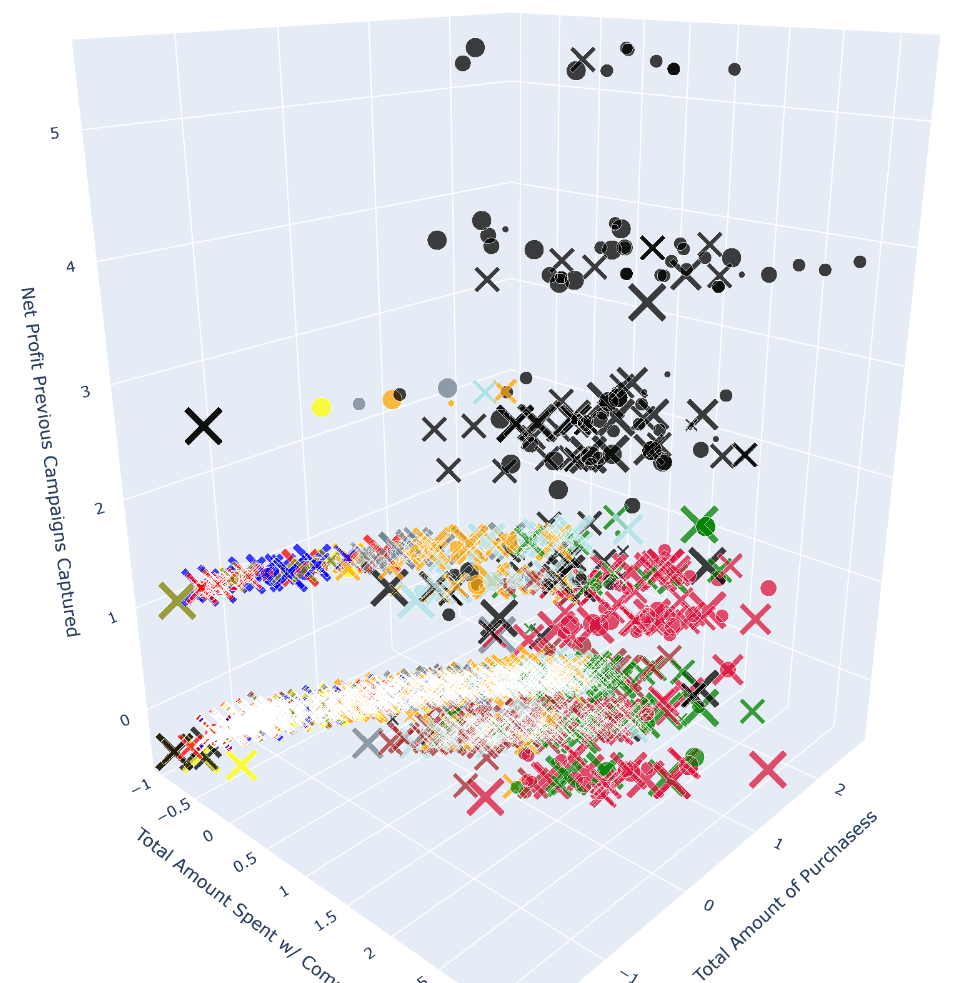

## Choosing 'Best' Clustering Method
So firstly, let's review which specific clustering method will be used here. In both cases, we will be using the PCA17 dataframe:
- `kmeans`: 4 clusters
- `HAgg-Ward`: 6 clusters

In [319]:
CustData["KMeans Cluster"] = pca17_df["KMeans-4 Cluster"]
CustData["HierAgg Cluster"] = pca17_df["HAgg - 6 Clusters"]
CustData.dtypes

Education                 int32
Marital_Status            int32
Income                  float64
Kidhome                   int64
Teenhome                  int64
                         ...   
TotalCmpAccepted          int64
NetProfitCmpCaptured      int64
Response                  int64
KMeans Cluster          float64
HierAgg Cluster         float64
Length: 63, dtype: object

So how do we compare these. Well we have a few metrics we could look at here and let's see which one maximizes each:
- Responses
    - Which results in the most responses being captured
- Total Amount Spent
    - Which results in the highest total spend
- Total Purchases
    - Which results in the most amount of purchases
- Net Profit on Historical Campaigns
    - Which clustering maximizes campaign profit yield

### Evaluating

    Marker: Cluster
        - 0: Square
        - 1: Circle
        - 2: Diamond-Open
        - 3: X
        - 4: Square-Open
        - 5: Diamond

We need to put this into scale first, let's see how many values belong to *each* cluster

In [320]:
kmeans_cluster_nums = CustData["KMeans Cluster"].value_counts()
hagg_cluster_nums = CustData["HierAgg Cluster"].value_counts()
print(kmeans_cluster_nums)
print(hagg_cluster_nums)

KMeans Cluster
2.0    1065
0.0     547
3.0     432
1.0     182
Name: count, dtype: int64
HierAgg Cluster
0.0    646
1.0    591
2.0    407
5.0    231
3.0    183
4.0    168
Name: count, dtype: int64


##### Response

In [321]:
kmeans_resp = CustData.groupby("KMeans Cluster")["Response"].sum()
hagg_resp = CustData.groupby("HierAgg Cluster")["Response"].sum()
print(kmeans_resp)
print(hagg_resp)

KMeans Cluster
0.0     76
1.0     40
2.0    148
3.0     67
Name: Response, dtype: int64
HierAgg Cluster
0.0    91
1.0    91
2.0    62
3.0    40
4.0    20
5.0    27
Name: Response, dtype: int64


##### Total Amount Spent

In [322]:
kmeans_totalmnt = CustData.groupby("KMeans Cluster")["TotalMnt"].sum()
hagg_totalmnt = CustData.groupby("HierAgg Cluster")["TotalMnt"].sum()
print(kmeans_totalmnt)
print(hagg_totalmnt)

KMeans Cluster
0.0    317952
1.0    134847
2.0    604631
3.0    290252
Name: TotalMnt, dtype: int64
HierAgg Cluster
0.0    402178
1.0    336629
2.0    239948
3.0    136577
4.0     93021
5.0    139329
Name: TotalMnt, dtype: int64


##### Total Purchases

In [323]:
kmeans_totalpur = CustData.groupby("KMeans Cluster")["TotalPurchases"].sum()
hagg_totalpur = CustData.groupby("HierAgg Cluster")["TotalPurchases"].sum()
print(kmeans_totalpur)
print(hagg_totalpur)

KMeans Cluster
0.0     6959
1.0     2535
2.0    12692
3.0     5724
Name: TotalPurchases, dtype: int64
HierAgg Cluster
0.0    8258
1.0    7263
2.0    5026
3.0    2563
4.0    2120
5.0    2680
Name: TotalPurchases, dtype: int64


##### Net Profit on Historical Campaigns

In [324]:
kmeans_netcmp = CustData.groupby("KMeans Cluster")["NetProfitCmpCaptured"].sum()
hagg_netcmp = CustData.groupby("HierAgg Cluster")["NetProfitCmpCaptured"].sum()
print(kmeans_netcmp)
print(hagg_netcmp)

KMeans Cluster
0.0    -6577
1.0    -1817
2.0   -12774
3.0    -4940
Name: NetProfitCmpCaptured, dtype: int64
HierAgg Cluster
0.0   -7644
1.0   -7160
2.0   -4675
3.0   -1832
4.0   -2080
5.0   -2717
Name: NetProfitCmpCaptured, dtype: int64


### Final Evaluation
#### Merging Groupby Results

In [325]:
kmeans_cluster_data = pd.merge(kmeans_resp,kmeans_totalmnt,on='KMeans Cluster')
kmeans_cluster_data = pd.merge(kmeans_cluster_data,kmeans_totalpur,on='KMeans Cluster')
kmeans_cluster_data = pd.merge(kmeans_cluster_data,kmeans_netcmp,on='KMeans Cluster')
kmeans_cluster_data = pd.merge(kmeans_cluster_data,kmeans_cluster_nums,on='KMeans Cluster')
# print(kmeans_cluster_data)
hieragg_cluster_data = pd.merge(hagg_resp,hagg_totalmnt,on='HierAgg Cluster')
hieragg_cluster_data = pd.merge(hieragg_cluster_data,hagg_totalpur,on='HierAgg Cluster')
hieragg_cluster_data = pd.merge(hieragg_cluster_data,hagg_netcmp,on='HierAgg Cluster')
hieragg_cluster_data = pd.merge(hieragg_cluster_data,hagg_cluster_nums,on='HierAgg Cluster')
# print(hieragg_cluster_data)

def extractData(grouped_df):
    df = pd.DataFrame(grouped_df).reset_index()
    df["AverageSpend"] = 0
    df["ResponseRate"] = 0
    df["ExpectedCostforOutreach"] = 0
    for index, row in df.iterrows():
        df.loc[index, "AverageSpend"] = row["TotalMnt"] / row["TotalPurchases"]
        df.loc[index, "ResponseRate"] = row["Response"] / row["count"]
        df.loc[index, "ExpectedCostforOutreach"] = row["NetProfitCmpCaptured"] / row["count"]
    return df

kmeans_cluster_data = extractData(kmeans_cluster_data)
hieragg_cluster_data = extractData(hieragg_cluster_data)

print(kmeans_cluster_data)
print(hieragg_cluster_data)

   KMeans Cluster  Response  TotalMnt  TotalPurchases  NetProfitCmpCaptured  \
0             0.0        76    317952            6959                 -6577   
1             1.0        40    134847            2535                 -1817   
2             2.0       148    604631           12692                -12774   
3             3.0        67    290252            5724                 -4940   

   count  AverageSpend  ResponseRate  ExpectedCostforOutreach  
0    547     45.689323      0.138940               -12.023766  
1    182     53.194083      0.219780                -9.983516  
2   1065     47.638749      0.138967               -11.994366  
3    432     50.707897      0.155093               -11.435185  
   HierAgg Cluster  Response  TotalMnt  TotalPurchases  NetProfitCmpCaptured  \
0              0.0        91    402178            8258                 -7644   
1              1.0        91    336629            7263                 -7160   
2              2.0        62    239948      

### Conclusion
This store should adapt the K-Means Clustering approach with 4 clusters! The second cluster, associated with `circles` in the initial axis plot, would be our most desirable customer group. While smaller than the rest of these clusters, this showed the highest average spend and response rate, while maintaining the smallest cost for outreach. The first cluster, or `square`, also looks like an *avoidable* group for our purposes, as they have the lowest response rate & average spend per purchase and also have the highest expected cost per outreach for campaigns.

The other two would require further analysis to evaluate their viability to attribute towards a successful marketing campaign, but having a bronze and gold tier customer group is an excellent beginning. I would install this clustering to help improve segmentation and then begin a new data collection campaign to verify the results in practice!

Finally, we will create a persona for our most desirable customer group!

#### Persona for Best Cluster
How approriate that the least desirable cluster were the `squares`! Let's dig into what the data tells us about the people of our `circle` cluster.

In [326]:
persona_cluster = CustData[CustData["KMeans Cluster"] == 1]
persona_cluster.describe()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,YearBecameCustomer,GenAG,10yrAG,15yrAG,HouseHoldIncomeNum,TotalChildren,TotalHHMembers,IncomeQuantile,TotalMnt,MntProtein,MntPesc,MntSemiHealth,MntIndulgence,DietRatio,IncomeLuxSpendRatio,Income difference from GenAG median,Income difference from 10yrAG median,Income difference from 15yrAG median,Income difference from Marital_Status median,Income difference from Education median,Income difference from TotalHHMembers median,Income difference from TotalChildren median,TotalMnt difference from GenAG median,TotalMnt difference from 10yrAG median,TotalMnt difference from 15yrAG median,TotalMnt difference from Marital_Status median,TotalMnt difference from Education median,TotalMnt difference from TotalHHMembers median,TotalMnt difference from TotalChildren median,TotalPurchases,ThriftRatio,WebVisitPurchaseRatio,OutOfStorePurchases,PreferredMedium,ContactlessRatio,TotalCmpAccepted,NetProfitCmpCaptured,Response,KMeans Cluster,HierAgg Cluster
count,182.000000,182.000000,182.00000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.00000,182.0,182.0
mean,2.351648,1.714286,55387.06044,0.401099,0.467033,51.576923,365.576923,27.615385,214.000000,49.071429,31.571429,53.082418,2.335165,4.483516,3.274725,6.170330,4.983516,0.109890,0.093407,0.131868,0.109890,0.010989,0.010989,1.010989,1.626374,2.324176,1.335165,1.648352,0.868132,2.516484,2.714286,740.917582,263.071429,76.686813,290.686813,397.148352,1.474536,639.249335,5543.304945,4292.697802,5435.184066,4324.164835,4164.895604,1125.228022,65.159341,350.967033,309.035714,350.560440,342.986264,340.626374,205.337912,159.719780,13.928571,0.224302,1.268548,7.758242,1.098901,0.516107,0.456044,-9.983516,0.21978,1.0,3.0
std,1.140647,1.090245,24363.66205,0.524113,0.552754,30.245078,352.243405,35.450929,262.025156,60.908684,39.756619,59.710987,2.233045,2.912585,3.377095,3.373376,2.562965,0.313616,0.291804,0.339281,0.313616,0.104539,0.104539,0.705065,1.371762,1.329382,0.953490,0.478802,0.789556,0.967570,1.205748,643.212327,298.037782,87.687956,319.142888,372.326143,5.386690,1023.860496,25018.047292,24451.429434,25011.296778,24619.316757,23827.837493,23076.152994,22269.595871,646.274349,620.789697,643.683604,643.839187,631.505894,558.066265,516.671918,7.469300,0.186028,1.053908,5.109499,0.537129,0.153845,0.754904,8.303947,0.41524,0.0,0.0
min,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,6.000000,2.000000,0.000000,2.000000,2.000000,0.040698,48.043724,-65174.000000,-66000.000000,-59354.000000,-56551.000000,-51594.000000,-72141.500000,-72066.000000,-568.500000,-950.000000,-619.000000,-595.000000,-477.000000,-1182.500000,-1183.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-15.000000,0.00000,1.0,3.0
25%,2.000000,1.000000,36416.75000,0.000000,0.000000,22.250000,26.000000,2.000000,19.500000,4.000000,2.000000,11.250000,1.000000,2.000000,1.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.00

In [327]:
compare_cluster = CustData[CustData["KMeans Cluster"] == 0] # went through 2 & 3 as well
compare_cluster.describe()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,YearBecameCustomer,GenAG,10yrAG,15yrAG,HouseHoldIncomeNum,TotalChildren,TotalHHMembers,IncomeQuantile,TotalMnt,MntProtein,MntPesc,MntSemiHealth,MntIndulgence,DietRatio,IncomeLuxSpendRatio,Income difference from GenAG median,Income difference from 10yrAG median,Income difference from 15yrAG median,Income difference from Marital_Status median,Income difference from Education median,Income difference from TotalHHMembers median,Income difference from TotalChildren median,TotalMnt difference from GenAG median,TotalMnt difference from 10yrAG median,TotalMnt difference from 15yrAG median,TotalMnt difference from Marital_Status median,TotalMnt difference from Education median,TotalMnt difference from TotalHHMembers median,TotalMnt difference from TotalChildren median,TotalPurchases,ThriftRatio,WebVisitPurchaseRatio,OutOfStorePurchases,PreferredMedium,ContactlessRatio,TotalCmpAccepted,NetProfitCmpCaptured,Response,KMeans Cluster,HierAgg Cluster
count,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.00000,547.0,547.000000
mean,2.442413,1.780622,51345.866545,0.466179,0.553931,47.917733,296.107861,25.303473,155.504570,33.888483,27.745887,42.714808,2.491773,4.208410,2.605119,5.908592,5.466179,0.069470,0.074954,0.056673,0.058501,0.010969,0.009141,1.009141,1.692870,2.447898,1.413163,1.661792,1.020110,2.681901,2.484461,581.265082,189.393053,59.191956,214.696527,323.853748,1.208060,633.114265,2104.237660,1635.783364,1873.018282,391.343693,571.036563,-705.319927,-666.623400,213.205667,204.854662,209.395795,185.611517,181.131627,124.001828,118.736746,12.722121,0.247691,1.061196,6.813528,1.096892,0.497782,0.270567,-12.023766,0.13894,0.0,1.634369
std,1.069846,1.068766,21314.714171,0.548265,0.549990,28.857529,314.956839,38.652856,213.850367,50.368681,41.849015,48.868245,1.945556,2.716198,2.842220,3.286511,2.282328,0.254484,0.263559,0.231428,0.234903,0.104252,0.095257,0.683337,1.369742,1.136527,0.817198,0.473533,0.729768,0.858752,1.088247,557.822274,244.400045,77.931181,267.668866,331.309949,3.159410,1029.039993,20997.029862,21030.375807,20709.651428,21217.668497,20370.726360,21236.656835,20291.132853,559.230631,558.121939,547.635162,559.366146,549.926233,538.052262,492.059740,7.051065,0.169404,1.414395,4.556720,0.440331,0.141735,0.634705,6.981752,0.34620,0.0,1.749345
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,10.000000,1.000000,0.000000,1.000000,0.000000,0.000000,19.939210,-57318.500000,-56551.000000,-59354.000000,-51521.000000,-51594.000000,-65581.500000,-72066.000000,-575.500000,-955.000000,-626.000000,-604.000000,-483.000000,-1169.500000,-1174.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-15.000000,0.00000,0.0,0.000000
25%,2.000000,1.000000,35259.000000,0.000000,0.000000,24.000000,29.000000,2.000000,16.500000,2.000000,2.000000,10.000000,1.000000,2.000000,0.000000,3.000000,4.000000,0.00

In [328]:
persona_cluster["Education"].value_counts()

Education
2    95
4    38
3    28
0    19
1     2
Name: count, dtype: int64

Encodings:
- `0` - 2n Cylce
- `1` - Basic
- `2` - Graduation (Bachelor's)
- `3` - Master
- `4` - PHD

In [329]:
persona_cluster["Marital_Status"].value_counts()

Marital_Status
1    71
3    47
2    36
0    21
4     7
Name: count, dtype: int64

Encodings:
- `0` - Divorced
- `1` - Married
- `2` - Single
- `3` - Together
- `4` - Widow

In [330]:
persona_cluster["GenAG"].value_counts()

GenAG
3    86
0    63
1    28
2     5
Name: count, dtype: int64

Encodings:
- `0` - Boomer
- `1` - Millen
- `2` - Sil. (Silent Gen)
- `3` - X (GenX)

In [331]:
persona_cluster["10yrAG"].value_counts()

10yrAG
3    61
1    37
2    35
4    22
0    18
5     9
Name: count, dtype: int64

Encodings:
- `0` - 40s
- `1` - 50s
- `2` - 60s
- `3` - 70s
- `4` - 80s
- `5` - 90s

In [332]:
persona_cluster["15yrAG"].value_counts()

15yrAG
2    69
1    51
0    44
3    18
Name: count, dtype: int64

Encodings:
- `0` - 40-55
- `1` - 56-70
- `2` - 71-85
- `3` - 86-96
    - `1996` is the youngest year

In [333]:
persona_cluster["PreferredMedium"].value_counts()

PreferredMedium
1    128
2     36
0     18
Name: count, dtype: int64

Encodings:
- `0` - Catalog
- `1` - Instore
- `2` - Web

## Persona
#### Meet Cluster-1 Persona: Sam Highsmith
***NOTE: With no sex/gender data, we will use a gender neutral name and description.***

Sam Highsmith is a Gen Xer, born in the mid-70s. Sam is someone who *really* enjoys life. Sam's appreciation for life revolves around their young teen at home, which is manageable thanks to the support of Sam's partner! After graduating with a bachelor's degree, Sam has been fortunate to earn a comfortable income. Due to this, Sam spends with a bit more flexibility than others who shop at our store. Sam's industry is highly competitive and as so, they feel more pressure to buy name brand and less-needed products than the lower income shoppers. This is reflected in his generally lower usage of coupons compared to other shoppers, with the name/product's reputation meaning more than saving a few bucks.

One specific item Sam loves to browse in our store is wine. Sam's high-income job does not come without a price, so Sam likes a nice glass of cabernet to relax after a particularly stressful day. Sam enjoys getting lost in our fine wine aisles, ensuring the stash is always well-stocked whenever it looks low. While Sam prefers to browse the wines in person when time allows, they also know exactly what they like when in a hurry — needing only a quick website visit or two before making the purchase online. 

Sam is more likely to respond positively to our campaigns compared to others, making them a strong candidate for engagement. Their higher income, combined with their willingness & social pressure to maintain their image, increases their desirability as a target for our store, especially our more luxurious items.